## 1.Ring Dataset

#### LASA

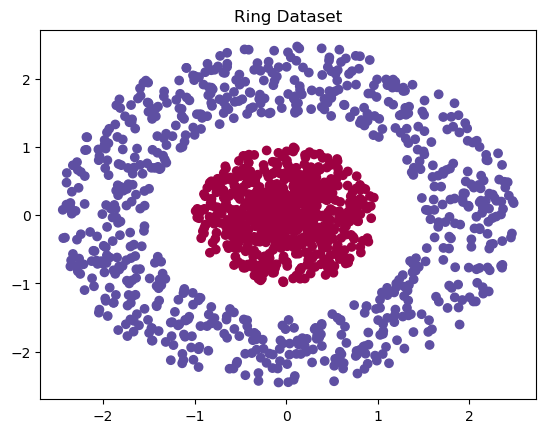


Running experiment with LASA...
Epoch 1/20, Avg Loss: 0.5922, Test Accuracy: 0.8033
Epoch 11/20, Avg Loss: 0.0809, Test Accuracy: 1.0000
Final Test Accuracy: 1.0000
Layer 1 - Initial k: 2.6, Final k: 2.5580
14472/14472 [==============================] - 18s 1ms/step


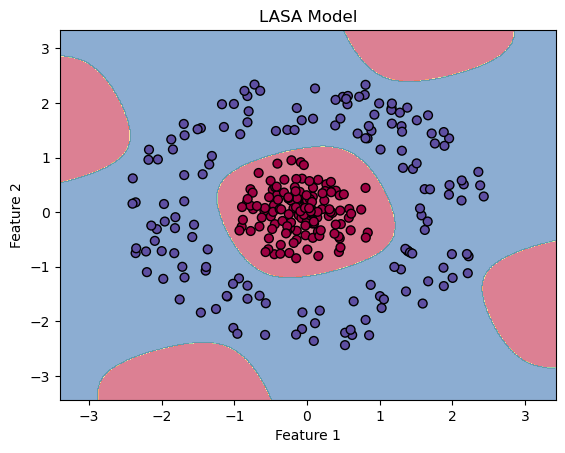


Summary of Results:
Final Test Accuracy: 1.0000


In [4]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


class SineActivation(tf.keras.layers.Layer):
    def __init__(self, initial_frequency, **kwargs):
        super().__init__(**kwargs)
        self.initial_frequency = initial_frequency
    
    def build(self, input_shape):
        self.freq = self.add_weight(shape=(), 
                                    initializer=tf.keras.initializers.Constant(self.initial_frequency),
                                    trainable=True, 
                                    name='freq')
    
    def call(self, inputs):
        return tf.math.sin(self.freq * inputs)


def make_ring(n_samples, num_rings=2):
    X, y = [], []
    for i in range(num_rings):
        r = np.random.rand(n_samples // num_rings) + i * 1.5
        theta = np.random.rand(n_samples // num_rings) * 2 * np.pi
        X.append(np.c_[r * np.cos(theta), r * np.sin(theta)])
        y.append(np.full(n_samples // num_rings, i))
    return np.concatenate(X), np.concatenate(y)


X_ring, y_ring = make_ring(n_samples=1500, num_rings=2)
X_train, X_test, y_train, y_test = train_test_split(X_ring, y_ring, test_size=0.2, random_state=42)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.show()


def create_model(activation, hidden_units, k_values):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    sine_layers_k = []
    for i, units in enumerate(hidden_units):
        if activation == 'sine':
            model.add(layers.Dense(units, name=f'dense_{i}'))
            sine_activation_layer = SineActivation(initial_frequency=k_values[i], name=f'sine_{i}')
            model.add(sine_activation_layer)
            sine_layers_k.append(sine_activation_layer)
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model, sine_layers_k

def train_step(model, x_batch, y_batch, optimizer_main, optimizer_k):
    y_batch = tf.expand_dims(y_batch, axis=1)  
    with tf.GradientTape() as tape:
        predictions = model(x_batch, training=True)
        loss = tf.keras.losses.binary_crossentropy(y_batch, predictions)
        loss = tf.reduce_mean(loss)
    
    grads = tape.gradient(loss, model.trainable_variables)
    
    k_vars = [v for v in model.trainable_variables if 'freq' in v.name]
    other_vars = [v for v in model.trainable_variables if 'freq' not in v.name]
    
    k_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' in v.name]
    other_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' not in v.name]
    
    optimizer_k.apply_gradients(zip(k_grads, k_vars))
    optimizer_main.apply_gradients(zip(other_grads, other_vars))
    
    return loss


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()


def run_experiment():
    H = [2]  
    K = [2.6]  
    learning_rate_main = 0.001
    learning_rate_k = 0.01
    epochs = 20
    batch_size = 32

    model, sine_layers_k = create_model('sine', H, K)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    optimizer_main = Adam(learning_rate=learning_rate_main)
    optimizer_k = Adam(learning_rate=learning_rate_k)

    for epoch in range(epochs):
        total_loss = 0.0
        num_batches = 0
        for i in range(0, len(X_train), batch_size):
            x_batch = X_train[i:i+batch_size]
            y_batch = y_train[i:i+batch_size]
            
            batch_loss = train_step(model, x_batch, y_batch, optimizer_main, optimizer_k)
            total_loss += batch_loss.numpy()
            num_batches += 1
        
        avg_loss = total_loss / num_batches
        
        if epoch % 10 == 0:
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            print(f"Epoch {epoch+1}/{epochs}, Avg Loss: {avg_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")

    for i, layer in enumerate(sine_layers_k):
        print(f"Layer {i+1} - Initial k: {K[i]}, Final k: {layer.freq.numpy():.4f}")
    

    plot_decision_boundary(X_test, y_test, model, 'LASA Model')

    return test_accuracy



plot_dataset(X_ring, y_ring, "Ring Dataset")


print(f"\nRunning experiment with LASA...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")


### All Activation


Running experiment with relu activation
Activation: relu, Test Accuracy: 0.6567
14814/14814 [==============================] - 11s 757us/step


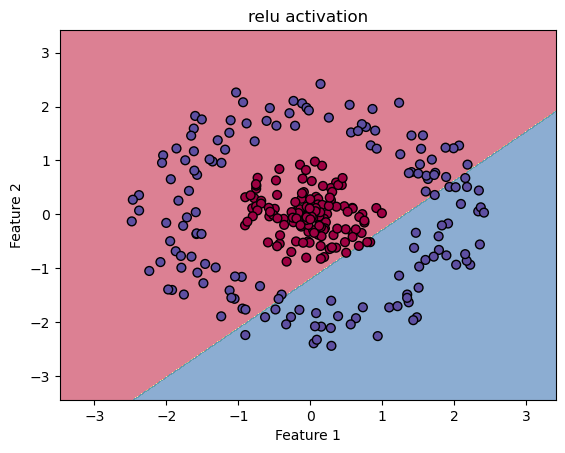


Running experiment with leaky_relu activation
Activation: leaky_relu, Test Accuracy: 0.7933
14814/14814 [==============================] - 11s 746us/step


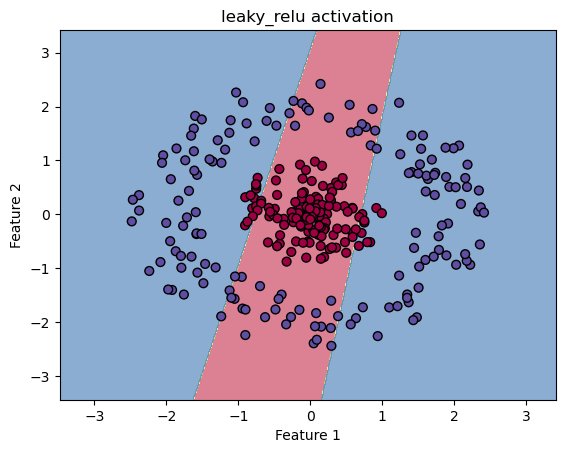


Running experiment with elu activation
Activation: elu, Test Accuracy: 0.8467
14814/14814 [==============================] - 12s 780us/step


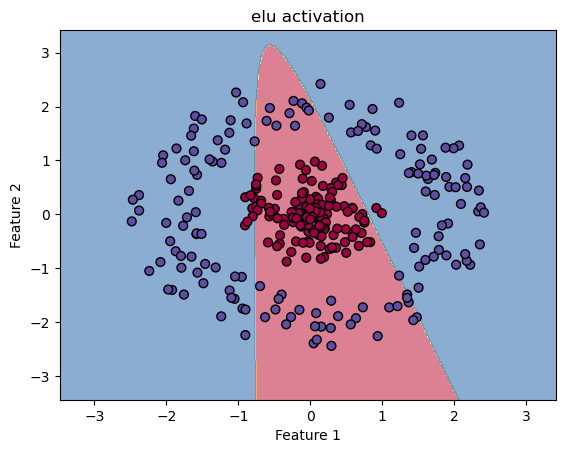


Running experiment with softplus activation
Activation: softplus, Test Accuracy: 0.8100
14814/14814 [==============================] - 12s 781us/step


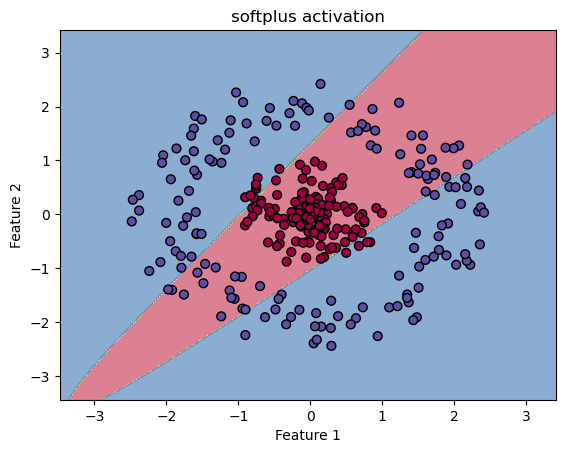


Running experiment with swish activation
Activation: swish, Test Accuracy: 0.7933
14814/14814 [==============================] - 12s 801us/step


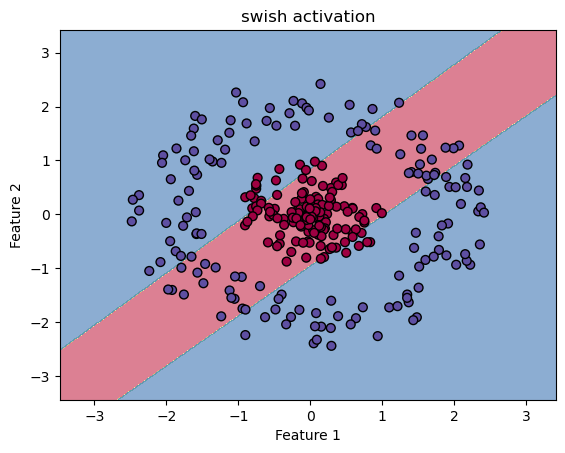


Running experiment with mish activation
Activation: mish, Test Accuracy: 0.9200
14814/14814 [==============================] - 12s 796us/step


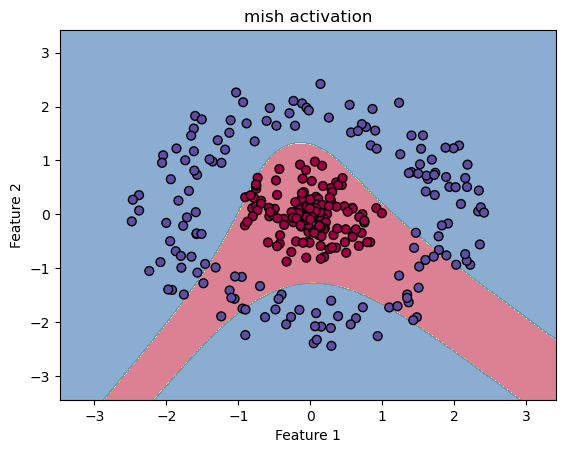


Running experiment with gelu activation
Activation: gelu, Test Accuracy: 0.8133
14814/14814 [==============================] - 14s 914us/step


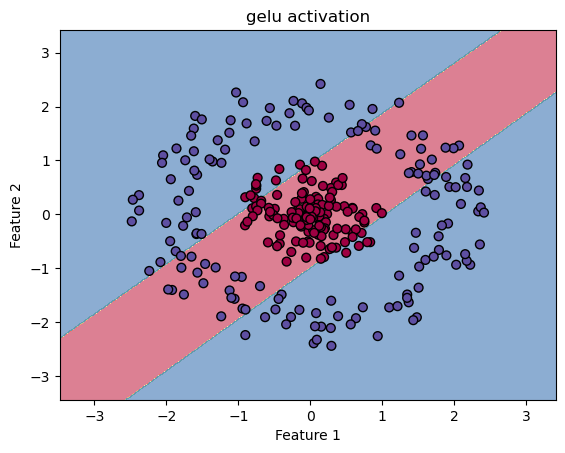

In [17]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


def mish(x):
    return x * tf.math.tanh(tf.math.softplus(x))


def make_ring(n_samples, num_rings=2):
    X, y = [], []
    for i in range(num_rings):
        r = np.random.rand(n_samples // num_rings) + i * 1.5
        theta = np.random.rand(n_samples // num_rings) * 2 * np.pi
        X.append(np.c_[r * np.cos(theta), r * np.sin(theta)])
        y.append(np.full(n_samples // num_rings, i))
    return np.concatenate(X), np.concatenate(y)


X_ring, y_ring = make_ring(n_samples=1500, num_rings=2)
X_train, X_test, y_train, y_test = train_test_split(X_ring, y_ring, test_size=0.2, random_state=42)

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))])
    
    for i, units in enumerate(hidden_units):
        model.add(layers.Dense(units, name=f'dense_{i}'))
        if activation == 'mish':
            model.add(layers.Lambda(mish))
        else:
            model.add(layers.Activation(activation))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int) 
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()


def run_experiment(activation):
    H = [2]
    learning_rate = 0.001
    epochs = 60
    batch_size = 32

 
    model = create_model(activation, H)

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    
    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

  
    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Activation: {activation}, Test Accuracy: {test_accuracy:.4f}")

  
    plot_decision_boundary(X_test, y_test, model, f'{activation} activation')


activations = ['relu', 'leaky_relu', 'elu', 'softplus', 'swish', 'mish', 'gelu']

for activation in activations:
    print(f"\nRunning experiment with {activation} activation")
    run_experiment(activation)


Activation: sine, Test Accuracy: 0.7933
14344/14344 [==============================] - 15s 1ms/step


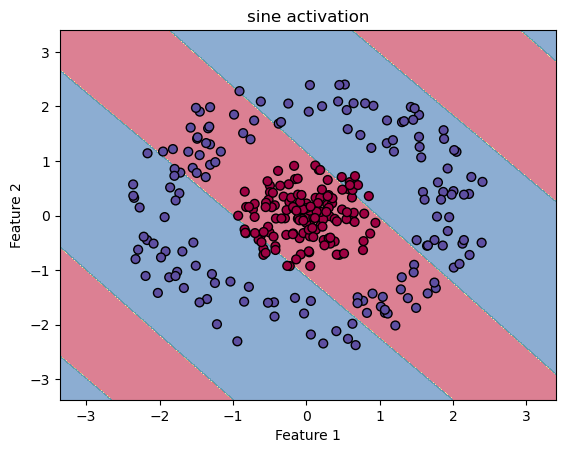

In [2]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


def sine(x):
    return tf.math.sin(x)


def make_ring(n_samples, num_rings=2):
    X, y = [], []
    for i in range(num_rings):
        r = np.random.rand(n_samples // num_rings) + i * 1.5
        theta = np.random.rand(n_samples // num_rings) * 2 * np.pi
        X.append(np.c_[r * np.cos(theta), r * np.sin(theta)])
        y.append(np.full(n_samples // num_rings, i))
    return np.concatenate(X), np.concatenate(y)


X_ring, y_ring = make_ring(n_samples=1500, num_rings=2)
X_train, X_test, y_train, y_test = train_test_split(
    X_ring, y_ring, test_size=0.2, random_state=42
)

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))])
    
    for i, units in enumerate(hidden_units):
        model.add(layers.Dense(units, name=f'dense_{i}'))
        if activation == 'sine':
            model.add(layers.Lambda(sine))
        else:
            model.add(layers.Activation(activation))
    

    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

def run_experiment(activation):
 
    H = [2]
    learning_rate = 0.001
    epochs = 60
    batch_size = 32

    model = create_model(activation, H)
    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    

    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)
    

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Activation: {activation}, Test Accuracy: {test_accuracy:.4f}")
    

    plot_decision_boundary(X_test, y_test, model, f'{activation} activation')


run_experiment('sine')


## 2.Spiral Dataset

### LASA

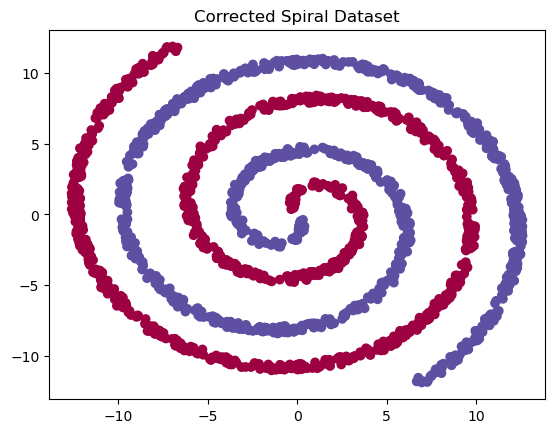


Running experiment with LASA...
Epoch 1/40, Avg Loss: 0.4860, Test Accuracy: 0.8675
Epoch 11/40, Avg Loss: 0.1522, Test Accuracy: 0.9600
Epoch 21/40, Avg Loss: 0.1033, Test Accuracy: 0.9800
Epoch 31/40, Avg Loss: 0.0810, Test Accuracy: 0.9975
Final Test Accuracy: 1.0000
Layer 1 - Initial k: 1.4, Final k: 1.0350
211777/211777 [==============================] - 196s 925us/step


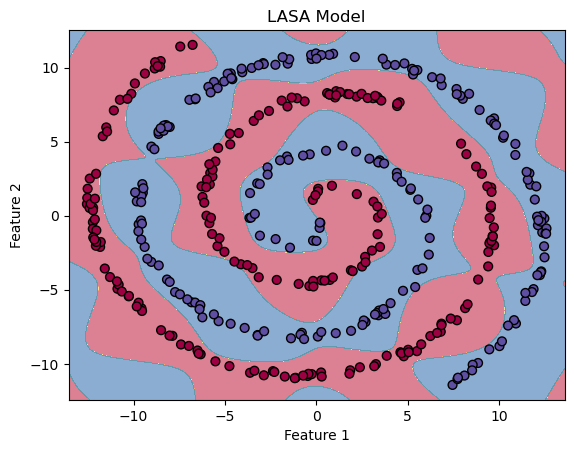


Summary of Results:
Final Test Accuracy: 1.0000


In [31]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


class SineActivation(tf.keras.layers.Layer):
    def __init__(self, initial_frequency, **kwargs):
        super().__init__(**kwargs)
        self.initial_frequency = initial_frequency
    
    def build(self, input_shape):
        self.freq = self.add_weight(shape=(), 
                                    initializer=tf.keras.initializers.Constant(self.initial_frequency),
                                    trainable=True, 
                                    name='freq')
    
    def call(self, inputs):
        return tf.math.sin(self.freq * inputs)


def make_spiral(n_samples, noise=0.5):
    n = np.sqrt(np.random.rand(n_samples, 1)) * 780 * (2 * np.pi) / 360
    d1x = -np.cos(n) * n + np.random.rand(n_samples, 1) * noise
    d1y = np.sin(n) * n + np.random.rand(n_samples, 1) * noise
    X = np.vstack((np.hstack((d1x, d1y)), np.hstack((-d1x, -d1y))))
    y = np.hstack((np.zeros(n_samples), np.ones(n_samples)))
    return X, y


X_spiral, y_spiral = make_spiral(n_samples=1000)
X_train, X_test, y_train, y_test = train_test_split(X_spiral, y_spiral, test_size=0.2, random_state=42)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.show()

def create_model(activation, hidden_units, k_values):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    sine_layers_k = []
    for i, units in enumerate(hidden_units):
        if activation == 'sine':
            model.add(layers.Dense(units, name=f'dense_{i}'))
            sine_activation_layer = SineActivation(initial_frequency=k_values[i], name=f'sine_{i}')
            model.add(sine_activation_layer)
            sine_layers_k.append(sine_activation_layer)
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model, sine_layers_k

def train_step(model, x_batch, y_batch, optimizer_main, optimizer_k):
    y_batch = tf.expand_dims(y_batch, axis=1)  
    with tf.GradientTape() as tape:
        predictions = model(x_batch, training=True)
        loss = tf.keras.losses.binary_crossentropy(y_batch, predictions)
        loss = tf.reduce_mean(loss)
    
    grads = tape.gradient(loss, model.trainable_variables)
    
    k_vars = [v for v in model.trainable_variables if 'freq' in v.name]
    other_vars = [v for v in model.trainable_variables if 'freq' not in v.name]
    
    k_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' in v.name]
    other_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' not in v.name]
    
    optimizer_k.apply_gradients(zip(k_grads, k_vars))
    optimizer_main.apply_gradients(zip(other_grads, other_vars))
    
    return loss


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()


def run_experiment():
    H = [12]  
    K = [1.4]  
    learning_rate_main = 0.001
    learning_rate_k = 0.01
    epochs = 40
    batch_size = 32

    model, sine_layers_k = create_model('sine', H, K)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    optimizer_main = Adam(learning_rate=learning_rate_main)
    optimizer_k = Adam(learning_rate=learning_rate_k)

    for epoch in range(epochs):
        total_loss = 0.0
        num_batches = 0
        for i in range(0, len(X_train), batch_size):
            x_batch = X_train[i:i+batch_size]
            y_batch = y_train[i:i+batch_size]
            
            batch_loss = train_step(model, x_batch, y_batch, optimizer_main, optimizer_k)
            total_loss += batch_loss.numpy()
            num_batches += 1
        
        avg_loss = total_loss / num_batches
        
        if epoch % 10 == 0:
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            print(f"Epoch {epoch+1}/{epochs}, Avg Loss: {avg_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")

    for i, layer in enumerate(sine_layers_k):
        print(f"Layer {i+1} - Initial k: {K[i]}, Final k: {layer.freq.numpy():.4f}")
    
    
    plot_decision_boundary(X_test, y_test, model, 'LASA Model')

    return test_accuracy


plot_dataset(X_spiral, y_spiral, "Corrected Spiral Dataset")


print(f"\nRunning experiment with LASA...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")


## All Activations


Running experiment with relu activation
Activation: relu, Test Accuracy: 0.6650
206940/206940 [==============================] - 178s 860us/step


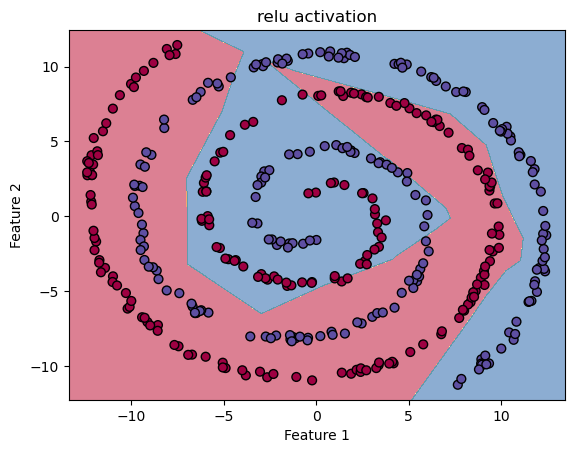


Running experiment with leaky_relu activation
Activation: leaky_relu, Test Accuracy: 0.5725
206940/206940 [==============================] - 184s 888us/step


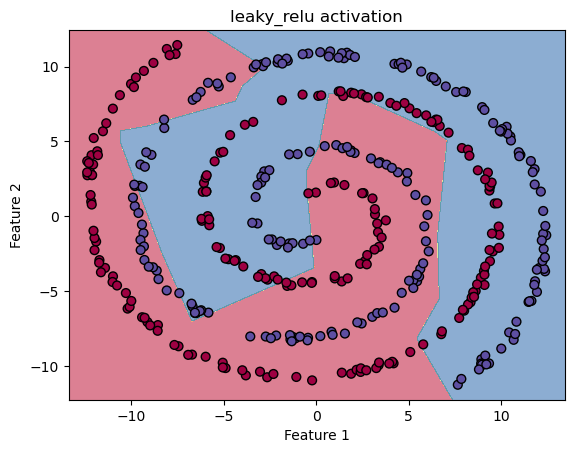


Running experiment with elu activation
Activation: elu, Test Accuracy: 0.5475
206940/206940 [==============================] - 207s 998us/step


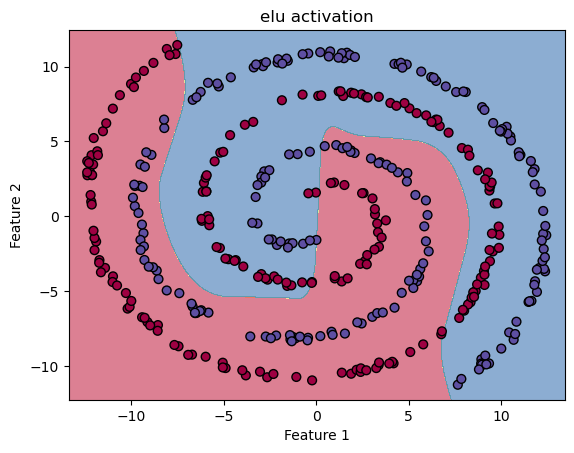


Running experiment with softplus activation
Activation: softplus, Test Accuracy: 0.5850
206940/206940 [==============================] - 204s 986us/step


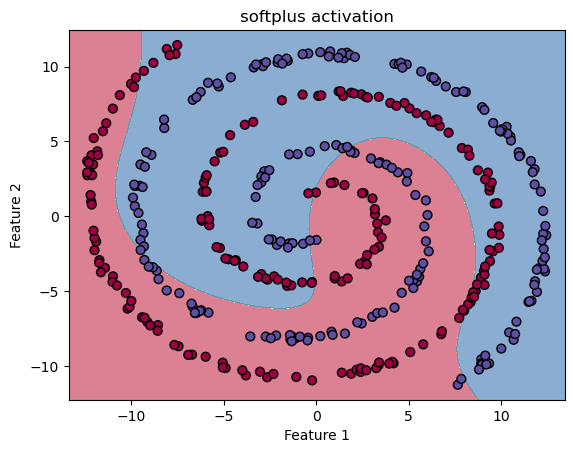


Running experiment with swish activation
Activation: swish, Test Accuracy: 0.7475
206940/206940 [==============================] - 235s 1ms/step


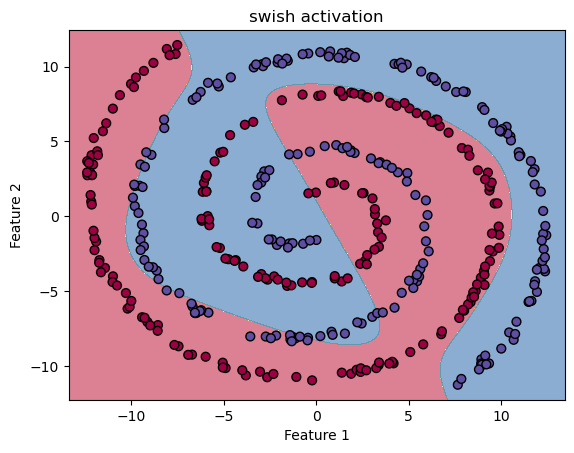


Running experiment with mish activation
Activation: mish, Test Accuracy: 0.7025
206940/206940 [==============================] - 189s 912us/step


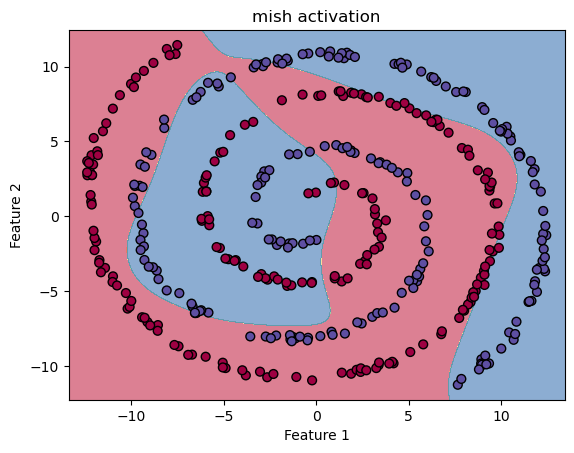


Running experiment with gelu activation
Activation: gelu, Test Accuracy: 0.6400
206940/206940 [==============================] - 177s 857us/step


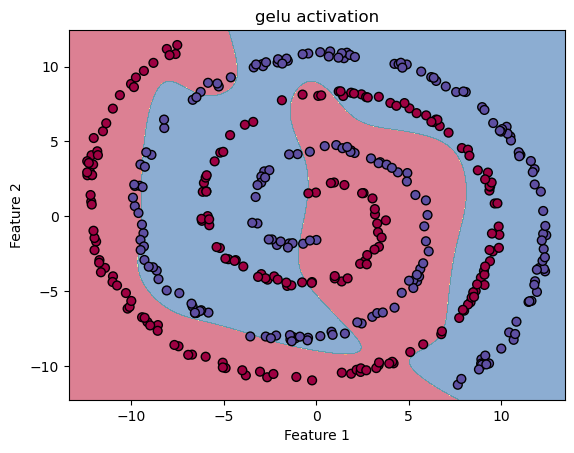

In [32]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


def mish(x):
    return x * tf.math.tanh(tf.math.softplus(x))


def make_spiral(n_samples, noise=0.5):
    n = np.sqrt(np.random.rand(n_samples, 1)) * 780 * (2 * np.pi) / 360
    d1x = -np.cos(n) * n + np.random.rand(n_samples, 1) * noise
    d1y = np.sin(n) * n + np.random.rand(n_samples, 1) * noise
    X = np.vstack((np.hstack((d1x, d1y)), np.hstack((-d1x, -d1y))))
    y = np.hstack((np.zeros(n_samples), np.ones(n_samples)))
    return X, y


X_spiral, y_spiral = make_spiral(n_samples=1000)
X_train, X_test, y_train, y_test = train_test_split(X_spiral, y_spiral, test_size=0.2, random_state=42)

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))])
    
    for i, units in enumerate(hidden_units):
        model.add(layers.Dense(units, name=f'dense_{i}'))
        if activation == 'mish':
            model.add(layers.Lambda(mish))
        else:
            model.add(layers.Activation(activation))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

def run_experiment(activation):
    H = [12]
    learning_rate = 0.001
    epochs = 60
    batch_size = 32
 
    model = create_model(activation, H)

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Activation: {activation}, Test Accuracy: {test_accuracy:.4f}")

    plot_decision_boundary(X_test, y_test, model, f'{activation} activation')


activations = ['relu', 'leaky_relu', 'elu', 'softplus', 'swish', 'mish', 'gelu']


for activation in activations:
    print(f"\nRunning experiment with {activation} activation")
    run_experiment(activation)


Activation: sine, Test Accuracy: 0.7150
220008/220008 [==============================] - 265s 1ms/step


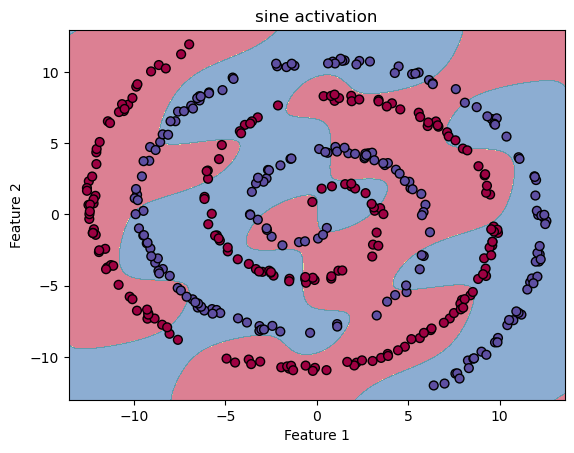

In [1]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


def sine(x):
    return tf.math.sin(x)


def make_spiral(n_samples, noise=0.5):
    n = np.sqrt(np.random.rand(n_samples, 1)) * 780 * (2 * np.pi) / 360
    d1x = -np.cos(n) * n + np.random.rand(n_samples, 1) * noise
    d1y = np.sin(n) * n + np.random.rand(n_samples, 1) * noise
    X = np.vstack((np.hstack((d1x, d1y)), np.hstack((-d1x, -d1y))))
    y = np.hstack((np.zeros(n_samples), np.ones(n_samples)))
    return X, y


X_spiral, y_spiral = make_spiral(n_samples=1000)
X_train, X_test, y_train, y_test = train_test_split(
    X_spiral, y_spiral, test_size=0.2, random_state=42
)

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))])
    
    for i, units in enumerate(hidden_units):
        model.add(layers.Dense(units, name=f'dense_{i}'))

        if activation == 'sine':
            model.add(layers.Lambda(sine))
        else:
            model.add(layers.Activation(activation))
    

    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

def run_experiment(activation):
    H = [12]
    learning_rate = 0.001
    epochs = 60
    batch_size = 32
 
    model = create_model(activation, H)
    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

   
    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)


    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Activation: {activation}, Test Accuracy: {test_accuracy:.4f}")

    
    plot_decision_boundary(X_test, y_test, model, f'{activation} activation')


run_experiment('sine')


## 3.Two Moon

### LASA

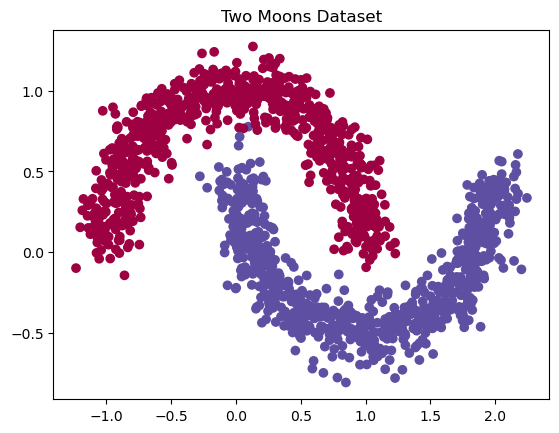


Running experiment with LASA...
Epoch 1/40, Avg Loss: 0.3522, Test Accuracy: 0.9033
Epoch 11/40, Avg Loss: 0.0186, Test Accuracy: 0.9967
Epoch 21/40, Avg Loss: 0.0095, Test Accuracy: 0.9967
Epoch 31/40, Avg Loss: 0.0074, Test Accuracy: 0.9967
Final Test Accuracy: 0.9967
Layer 1 - Initial k: 1.6, Final k: 2.4853
6634/6634 [==============================] - 6s 944us/step


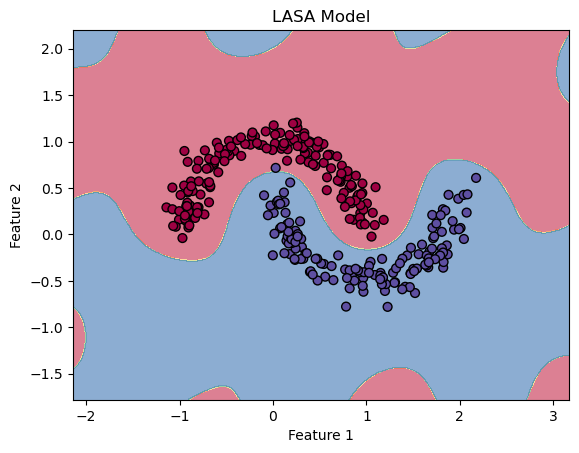


Summary of Results:
Final Test Accuracy: 0.9967


In [2]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
import matplotlib.pyplot as plt


class SineActivation(tf.keras.layers.Layer):
    def __init__(self, initial_frequency, **kwargs):
        super().__init__(**kwargs)
        self.initial_frequency = initial_frequency
    
    def build(self, input_shape):
        self.freq = self.add_weight(shape=(), 
                                    initializer=tf.keras.initializers.Constant(self.initial_frequency),
                                    trainable=True, 
                                    name='freq')
    
    def call(self, inputs):
        return tf.math.sin(self.freq * inputs)


def make_two_moons(n_samples, noise=0.1):
    X, y = make_moons(n_samples=n_samples, noise=noise, random_state=42)
    return X, y


X_moons, y_moons = make_two_moons(n_samples=1500, noise=0.1)
X_train, X_test, y_train, y_test = train_test_split(X_moons, y_moons, test_size=0.2, random_state=42)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.show()

def create_model(activation, hidden_units, k_values):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    sine_layers_k = []
    for i, units in enumerate(hidden_units):
        if activation == 'sine':
            model.add(layers.Dense(units, name=f'dense_{i}'))
            sine_activation_layer = SineActivation(initial_frequency=k_values[i], name=f'sine_{i}')
            model.add(sine_activation_layer)
            sine_layers_k.append(sine_activation_layer)
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model, sine_layers_k

def train_step(model, x_batch, y_batch, optimizer_main, optimizer_k):
    y_batch = tf.expand_dims(y_batch, axis=1)  
    with tf.GradientTape() as tape:
        predictions = model(x_batch, training=True)
        loss = tf.keras.losses.binary_crossentropy(y_batch, predictions)
        loss = tf.reduce_mean(loss)
    
    grads = tape.gradient(loss, model.trainable_variables)
    
    k_vars = [v for v in model.trainable_variables if 'freq' in v.name]
    other_vars = [v for v in model.trainable_variables if 'freq' not in v.name]
    
    k_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' in v.name]
    other_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' not in v.name]
    
    optimizer_k.apply_gradients(zip(k_grads, k_vars))
    optimizer_main.apply_gradients(zip(other_grads, other_vars))
    
    return loss


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()


def run_experiment():
    H = [3]  
    K = [1.6] 
    learning_rate_main = 0.01
    learning_rate_k = 0.01
    epochs = 40
    batch_size = 32

    model, sine_layers_k = create_model('sine', H, K)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    optimizer_main = Adam(learning_rate=learning_rate_main)
    optimizer_k = Adam(learning_rate=learning_rate_k)

    for epoch in range(epochs):
        total_loss = 0.0
        num_batches = 0
        for i in range(0, len(X_train), batch_size):
            x_batch = X_train[i:i+batch_size]
            y_batch = y_train[i:i+batch_size]
            
            batch_loss = train_step(model, x_batch, y_batch, optimizer_main, optimizer_k)
            total_loss += batch_loss.numpy()
            num_batches += 1
        
        avg_loss = total_loss / num_batches
        
        if epoch % 10 == 0:
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            print(f"Epoch {epoch+1}/{epochs}, Avg Loss: {avg_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")

    for i, layer in enumerate(sine_layers_k):
        print(f"Layer {i+1} - Initial k: {K[i]}, Final k: {layer.freq.numpy():.4f}")
    
  
    plot_decision_boundary(X_test, y_test, model, 'LASA Model')

    return test_accuracy


plot_dataset(X_moons, y_moons, "Two Moons Dataset")

print(f"\nRunning experiment with LASA...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")


### All Activations


Running experiment with relu activation
Activation: relu, Test Accuracy: 0.5000
6672/6672 [==============================] - 6s 831us/step


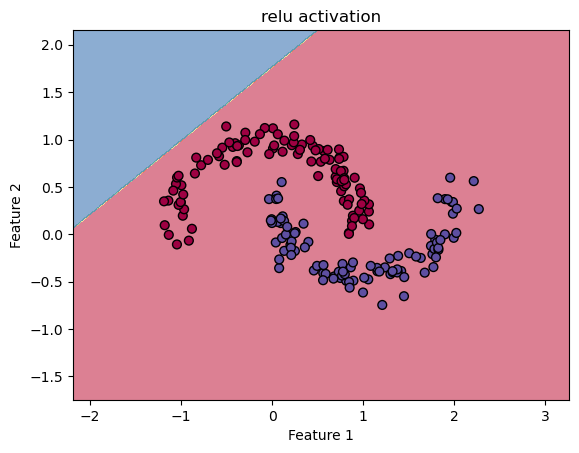


Running experiment with leaky_relu activation
Activation: leaky_relu, Test Accuracy: 0.8700
6672/6672 [==============================] - 5s 791us/step


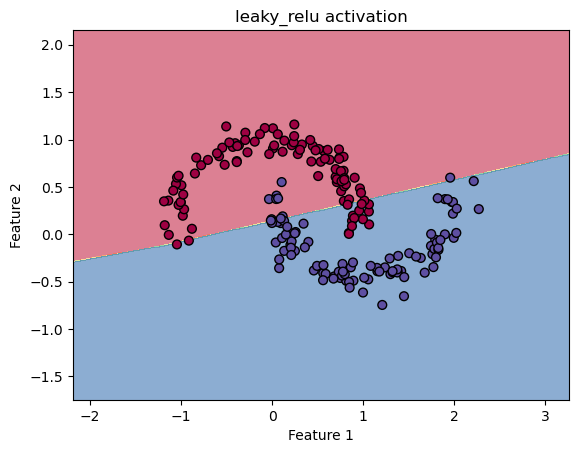


Running experiment with elu activation
Activation: elu, Test Accuracy: 0.8700
6672/6672 [==============================] - 6s 806us/step


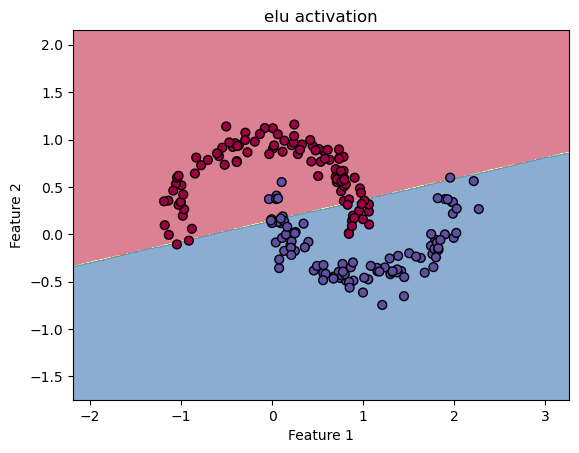


Running experiment with softplus activation
Activation: softplus, Test Accuracy: 0.9000
6672/6672 [==============================] - 5s 803us/step


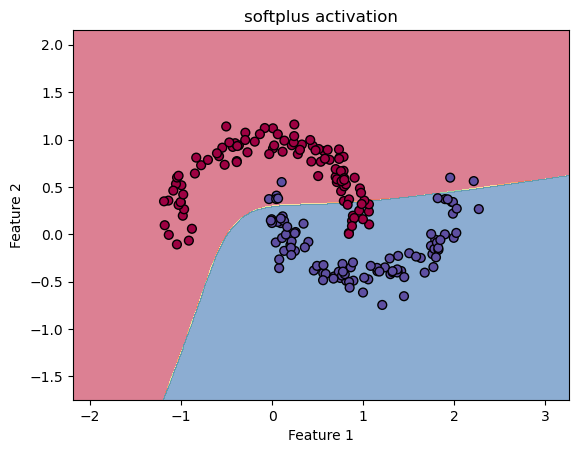


Running experiment with swish activation
Activation: swish, Test Accuracy: 0.9050
6672/6672 [==============================] - 5s 799us/step


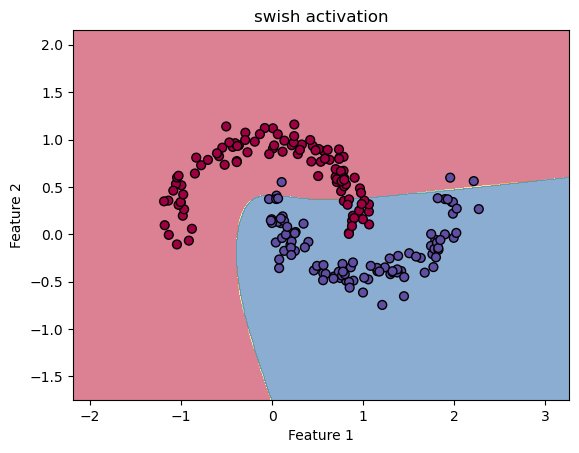


Running experiment with mish activation
Activation: mish, Test Accuracy: 0.9000
6672/6672 [==============================] - 6s 846us/step


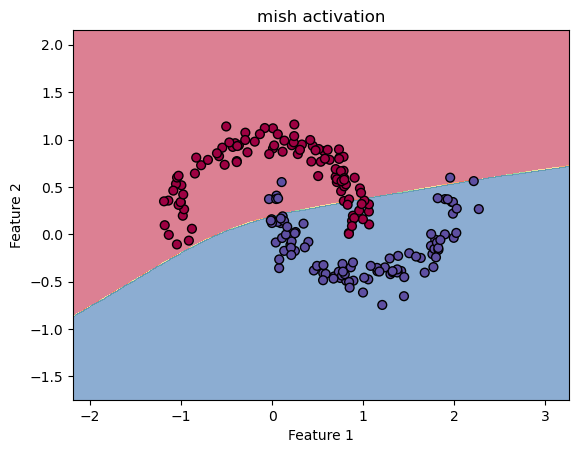


Running experiment with gelu activation
Activation: gelu, Test Accuracy: 0.8900
6672/6672 [==============================] - 5s 802us/step


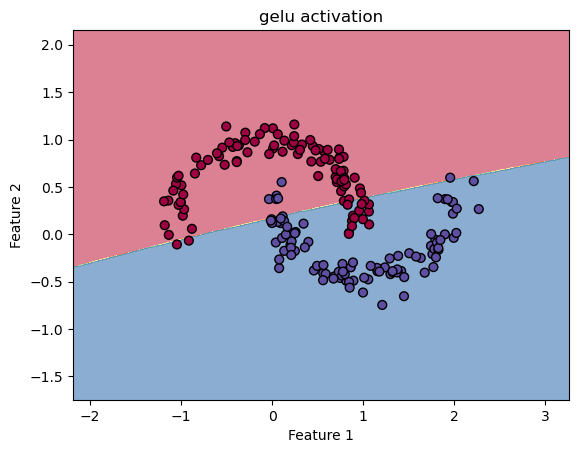

In [46]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
import matplotlib.pyplot as plt


def mish(x):
    return x * tf.math.tanh(tf.math.softplus(x))


def make_two_moons(n_samples, noise=0.1):
    X, y = make_moons(n_samples=n_samples, noise=noise, random_state=42)
    return X, y


X_moons, y_moons = make_two_moons(n_samples=1000, noise=0.1)
X_train, X_test, y_train, y_test = train_test_split(X_moons, y_moons, test_size=0.2, random_state=42)

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))])
    
    for i, units in enumerate(hidden_units):
        model.add(layers.Dense(units, name=f'dense_{i}'))
        if activation == 'mish':
            model.add(layers.Lambda(mish))
        else:
            model.add(layers.Activation(activation))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

def run_experiment(activation):
    H = [3]
    learning_rate = 0.01
    epochs = 60
    batch_size = 32
 
    model = create_model(activation, H)

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Activation: {activation}, Test Accuracy: {test_accuracy:.4f}")

    plot_decision_boundary(X_test, y_test, model, f'{activation} activation')


activations = ['relu', 'leaky_relu', 'elu', 'softplus', 'swish', 'mish', 'gelu']


for activation in activations:
    print(f"\nRunning experiment with {activation} activation")
    run_experiment(activation)


Sine Activation - Test Accuracy: 0.8800
6672/6672 [==============================] - 6s 951us/step


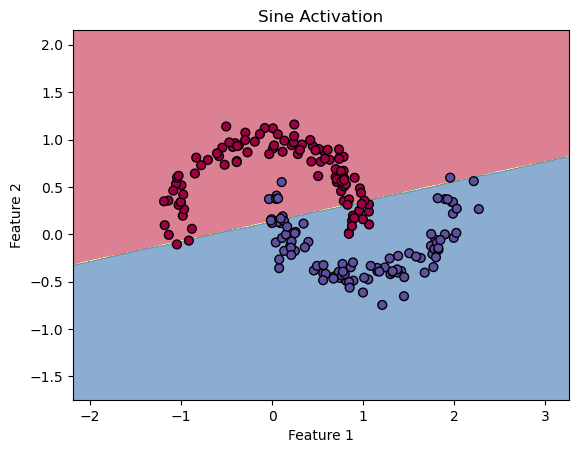

In [6]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
import matplotlib.pyplot as plt


def sine(x):
    return tf.math.sin(x)


def make_two_moons(n_samples, noise=0.1):
    X, y = make_moons(n_samples=n_samples, noise=noise, random_state=42)
    return X, y


X_moons, y_moons = make_two_moons(n_samples=1000, noise=0.1)
X_train, X_test, y_train, y_test = train_test_split(
    X_moons, y_moons, test_size=0.2, random_state=42
)


def create_model(hidden_units):
    model = Sequential([layers.Input(shape=(2,))])
    
    for i, units in enumerate(hidden_units):
        model.add(layers.Dense(units, name=f'dense_{i}'))
     
        model.add(layers.Lambda(sine))
    
  
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

def run_experiment():
    H = [3]  
    learning_rate = 0.01
    epochs = 60
    batch_size = 32

    model = create_model(H)
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )


    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)


    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Sine Activation - Test Accuracy: {test_accuracy:.4f}")

    
    plot_decision_boundary(X_test, y_test, model, 'Sine Activation')


run_experiment()


## 4.Checkerboard

### LASA

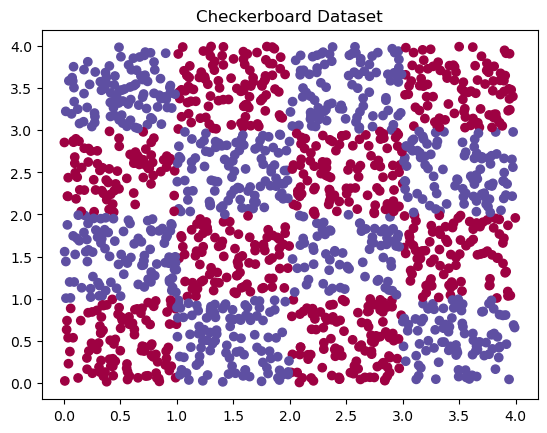


Running experiment with LASA...
Epoch 1/60, Avg Loss: 0.6969, Test Accuracy: 0.5767
Epoch 11/60, Avg Loss: 0.2523, Test Accuracy: 0.8533
Epoch 21/60, Avg Loss: 0.2145, Test Accuracy: 0.9167
Epoch 31/60, Avg Loss: 0.1946, Test Accuracy: 0.9233
Epoch 41/60, Avg Loss: 0.1809, Test Accuracy: 0.9233
Epoch 51/60, Avg Loss: 0.1512, Test Accuracy: 0.9400
Final Test Accuracy: 0.9433
Layer 1 - Initial k: 1.6, Final k: 1.7688
Layer 2 - Initial k: 1.4, Final k: 1.3626
11101/11101 [==============================] - 11s 975us/step


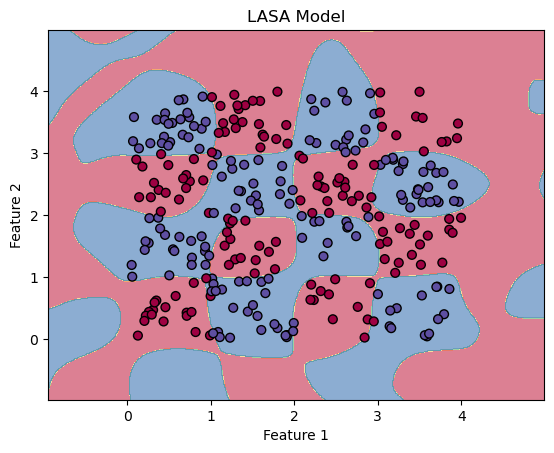


Summary of Results:
Final Test Accuracy: 0.9433


In [44]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


class SineActivation(tf.keras.layers.Layer):
    def __init__(self, initial_frequency, **kwargs):
        super().__init__(**kwargs)
        self.initial_frequency = initial_frequency
    
    def build(self, input_shape):
        self.freq = self.add_weight(shape=(), 
                                    initializer=tf.keras.initializers.Constant(self.initial_frequency),
                                    trainable=True, 
                                    name='freq')
    
    def call(self, inputs):
        return tf.math.sin(self.freq * inputs)


def make_checkerboard(n_samples, grid_size=4):
    X = np.random.rand(n_samples, 2) * grid_size
    y = (np.floor(X[:, 0]) + np.floor(X[:, 1])) % 2
    y = y.astype(int)
    return X, y


X_checkerboard, y_checkerboard = make_checkerboard(n_samples=1500, grid_size=4)
X_train, X_test, y_train, y_test = train_test_split(X_checkerboard, y_checkerboard, test_size=0.2, random_state=42)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.show()

def create_model(activation, hidden_units, k_values):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    sine_layers_k = []
    for i, units in enumerate(hidden_units):
        if activation == 'sine':
            model.add(layers.Dense(units, name=f'dense_{i}'))
            sine_activation_layer = SineActivation(initial_frequency=k_values[i], name=f'sine_{i}')
            model.add(sine_activation_layer)
            sine_layers_k.append(sine_activation_layer)
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model, sine_layers_k

def train_step(model, x_batch, y_batch, optimizer_main, optimizer_k):
    y_batch = tf.expand_dims(y_batch, axis=1)  # Reshape y_batch to match the shape of predictions
    with tf.GradientTape() as tape:
        predictions = model(x_batch, training=True)
        loss = tf.keras.losses.binary_crossentropy(y_batch, predictions)
        loss = tf.reduce_mean(loss)
    
    grads = tape.gradient(loss, model.trainable_variables)
    
    k_vars = [v for v in model.trainable_variables if 'freq' in v.name]
    other_vars = [v for v in model.trainable_variables if 'freq' not in v.name]
    
    k_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' in v.name]
    other_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' not in v.name]
    
    optimizer_k.apply_gradients(zip(k_grads, k_vars))
    optimizer_main.apply_gradients(zip(other_grads, other_vars))
    
    return loss


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int) 
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()


def run_experiment():
    H = [16,4]  
    K = [1.6,1.4]  
    learning_rate_main = 0.01
    learning_rate_k = 0.01
    epochs = 60
    batch_size = 32

    model, sine_layers_k = create_model('sine', H, K)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    optimizer_main = Adam(learning_rate=learning_rate_main)
    optimizer_k = Adam(learning_rate=learning_rate_k)

    for epoch in range(epochs):
        total_loss = 0.0
        num_batches = 0
        for i in range(0, len(X_train), batch_size):
            x_batch = X_train[i:i+batch_size]
            y_batch = y_train[i:i+batch_size]
            
            batch_loss = train_step(model, x_batch, y_batch, optimizer_main, optimizer_k)
            total_loss += batch_loss.numpy()
            num_batches += 1
        
        avg_loss = total_loss / num_batches
        
        if epoch % 10 == 0:
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            print(f"Epoch {epoch+1}/{epochs}, Avg Loss: {avg_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")

    for i, layer in enumerate(sine_layers_k):
        print(f"Layer {i+1} - Initial k: {K[i]}, Final k: {layer.freq.numpy():.4f}")
    
  
    plot_decision_boundary(X_test, y_test, model, 'LASA Model')

    return test_accuracy

plot_dataset(X_checkerboard, y_checkerboard, "Checkerboard Dataset")

print(f"\nRunning experiment with LASA...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")


### All Activations


Running experiment with relu activation
Activation: relu, Test Accuracy: 0.7100
11008/11008 [==============================] - 9s 817us/step


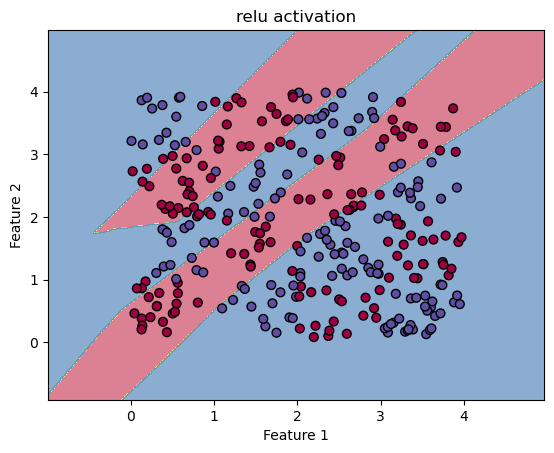


Running experiment with leaky_relu activation
Activation: leaky_relu, Test Accuracy: 0.6733
11008/11008 [==============================] - 9s 835us/step


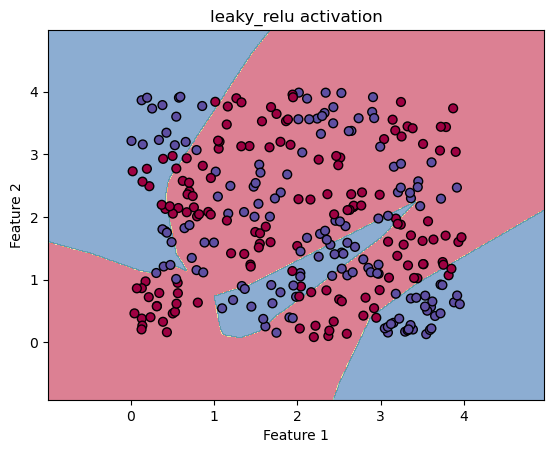


Running experiment with elu activation
Activation: elu, Test Accuracy: 0.5567
11008/11008 [==============================] - 9s 795us/step


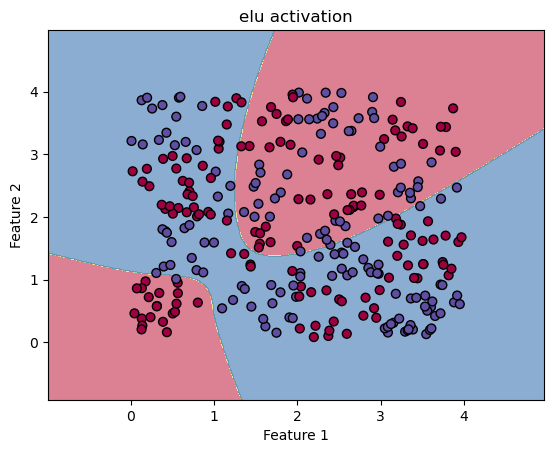


Running experiment with softplus activation
Activation: softplus, Test Accuracy: 0.6400
11008/11008 [==============================] - 9s 837us/step


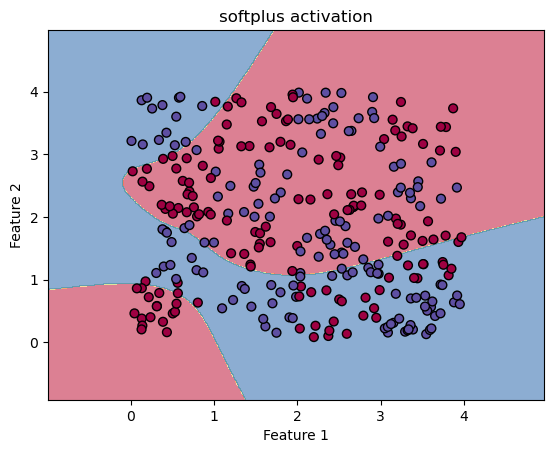


Running experiment with swish activation
Activation: swish, Test Accuracy: 0.8167
11008/11008 [==============================] - 9s 804us/step


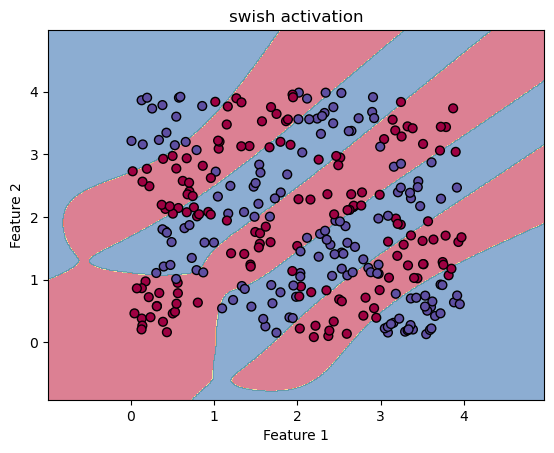


Running experiment with mish activation
Activation: mish, Test Accuracy: 0.8033
11008/11008 [==============================] - 9s 814us/step


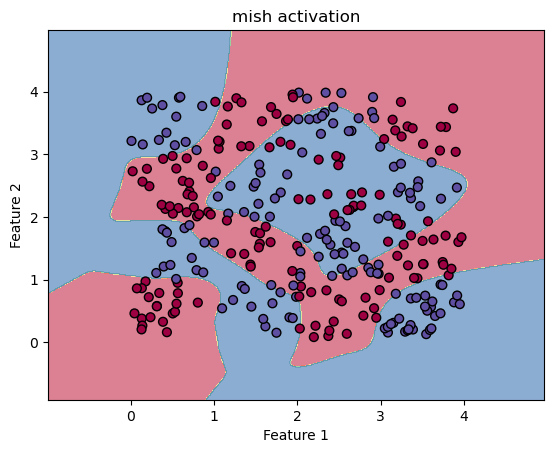


Running experiment with gelu activation
Activation: gelu, Test Accuracy: 0.6333
11008/11008 [==============================] - 9s 771us/step


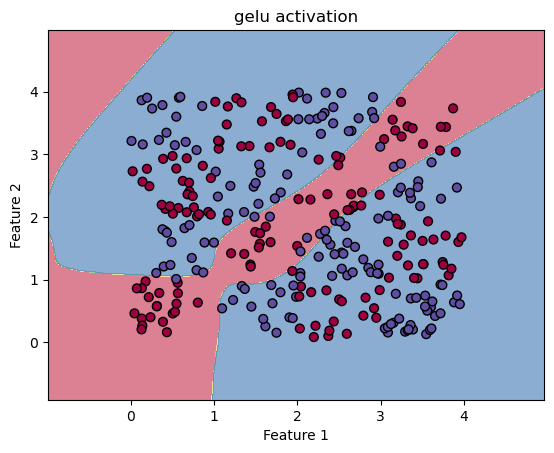

In [45]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


def mish(x):
    return x * tf.math.tanh(tf.math.softplus(x))


def make_checkerboard(n_samples, grid_size=4):
    X = np.random.rand(n_samples, 2) * grid_size
    y = (np.floor(X[:, 0]) + np.floor(X[:, 1])) % 2
    y = y.astype(int)
    return X, y

X_checkerboard, y_checkerboard = make_checkerboard(n_samples=1500, grid_size=4)
X_train, X_test, y_train, y_test = train_test_split(X_checkerboard, y_checkerboard, test_size=0.2, random_state=42)

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))])
    
    for i, units in enumerate(hidden_units):
        model.add(layers.Dense(units, name=f'dense_{i}'))
        if activation == 'mish':
            model.add(layers.Lambda(mish))
        else:
            model.add(layers.Activation(activation))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int) 
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

def run_experiment(activation):
    H = [16,4]
    learning_rate = 0.01
    epochs = 60
    batch_size = 32

    model = create_model(activation, H)

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Activation: {activation}, Test Accuracy: {test_accuracy:.4f}")

    plot_decision_boundary(X_test, y_test, model, f'{activation} activation')

activations = ['relu', 'leaky_relu', 'elu', 'softplus', 'swish', 'mish', 'gelu']

for activation in activations:
    print(f"\nRunning experiment with {activation} activation")
    run_experiment(activation)


## SINE

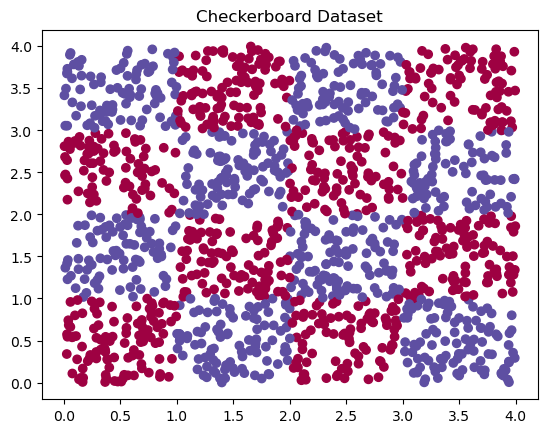


Running experiment with standard sine activation...
Epoch 1/60, Loss: 0.7236, Test Accuracy: 0.4833
Epoch 11/60, Loss: 0.6787, Test Accuracy: 0.4467
Epoch 21/60, Loss: 0.6696, Test Accuracy: 0.4867
Epoch 31/60, Loss: 0.6597, Test Accuracy: 0.4500
Epoch 41/60, Loss: 0.6499, Test Accuracy: 0.5300
Epoch 51/60, Loss: 0.6428, Test Accuracy: 0.5200
Final Test Accuracy: 0.5033
11213/11213 [==============================] - 16s 1ms/step


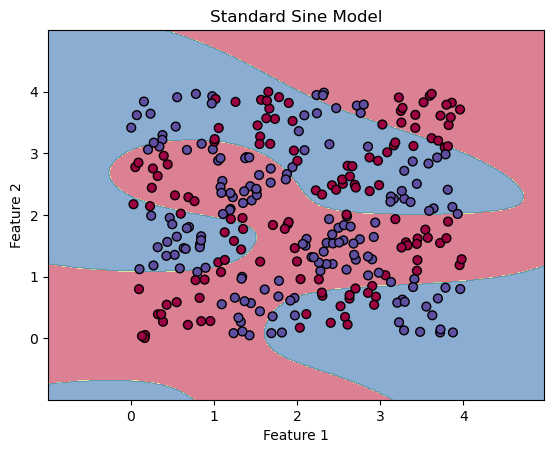


Summary of Results:
Final Test Accuracy: 0.5033


In [3]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

class SineActivation(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
    
    def call(self, inputs):
        return tf.math.sin(inputs)


def make_checkerboard(n_samples, grid_size=4):
    X = np.random.rand(n_samples, 2) * grid_size
    y = (np.floor(X[:, 0]) + np.floor(X[:, 1])) % 2
    y = y.astype(int)
    return X, y


X_checkerboard, y_checkerboard = make_checkerboard(n_samples=1500, grid_size=4)
X_train, X_test, y_train, y_test = train_test_split(X_checkerboard, y_checkerboard, test_size=0.2, random_state=42)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.show()

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    for i, units in enumerate(hidden_units):
        if activation == 'sine':
            model.add(layers.Dense(units, name=f'dense_{i}'))
            model.add(SineActivation(name=f'sine_{i}'))
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()


def run_experiment():
  
    H = [16, 4]  
    learning_rate = 0.01
    epochs = 60
    batch_size = 32

    model = create_model('sine', H)
    

    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy', 
        metrics=['accuracy']
    )


    history = model.fit(
        X_train, y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(X_test, y_test),
        verbose=0
    )
    

    for epoch in range(0, epochs, 10):
        print(f"Epoch {epoch+1}/{epochs}, Loss: {history.history['loss'][epoch]:.4f}, "
              f"Test Accuracy: {history.history['val_accuracy'][epoch]:.4f}")


    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")
    

    plot_decision_boundary(X_test, y_test, model, 'Standard Sine Model')

    return test_accuracy


plot_dataset(X_checkerboard, y_checkerboard, "Checkerboard Dataset")

print(f"\nRunning experiment with standard sine activation...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")

## 5.XOR

### LASA

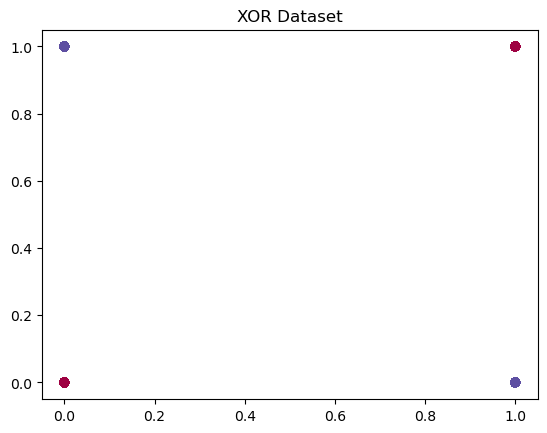


Running experiment with LASA...
Epoch 1/20, Avg Loss: 0.6893, Test Accuracy: 0.7500
Epoch 11/20, Avg Loss: 0.1669, Test Accuracy: 1.0000
Final Test Accuracy: 1.0000
Layer 1 - Initial k: 1.6, Final k: 3.2638
2813/2813 [==============================] - 2s 799us/step


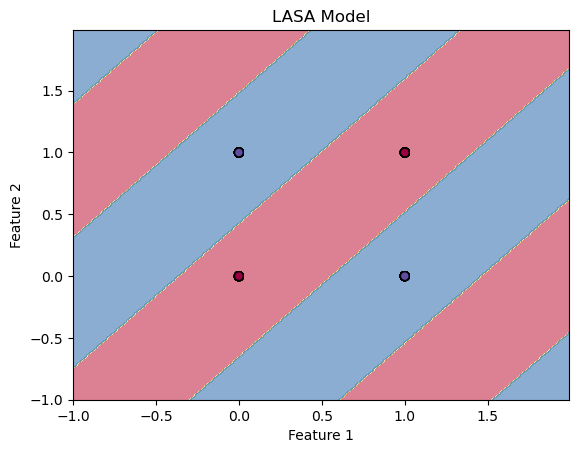


Summary of Results:
Final Test Accuracy: 1.0000


In [50]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Custom Sine Activation Layer
class SineActivation(tf.keras.layers.Layer):
    def __init__(self, initial_frequency, **kwargs):
        super().__init__(**kwargs)
        self.initial_frequency = initial_frequency
    
    def build(self, input_shape):
        self.freq = self.add_weight(shape=(), 
                                    initializer=tf.keras.initializers.Constant(self.initial_frequency),
                                    trainable=True, 
                                    name='freq')
    
    def call(self, inputs):
        return tf.math.sin(self.freq * inputs)


def make_xor(n_samples):
    X = np.random.rand(n_samples, 2) > 0.5
    y = np.logical_xor(X[:, 0], X[:, 1]).astype(int)
    return X, y


X_xor, y_xor = make_xor(n_samples=1500)
X_train, X_test, y_train, y_test = train_test_split(X_xor, y_xor, test_size=0.2, random_state=42)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.show()

def create_model(activation, hidden_units, k_values):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    sine_layers_k = []
    for i, units in enumerate(hidden_units):
        if activation == 'sine':
            model.add(layers.Dense(units, name=f'dense_{i}'))
            sine_activation_layer = SineActivation(initial_frequency=k_values[i], name=f'sine_{i}')
            model.add(sine_activation_layer)
            sine_layers_k.append(sine_activation_layer)
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model, sine_layers_k

def train_step(model, x_batch, y_batch, optimizer_main, optimizer_k):
    y_batch = tf.expand_dims(y_batch, axis=1)  # Reshape y_batch to match the shape of predictions
    with tf.GradientTape() as tape:
        predictions = model(x_batch, training=True)
        loss = tf.keras.losses.binary_crossentropy(y_batch, predictions)
        loss = tf.reduce_mean(loss)
    
    grads = tape.gradient(loss, model.trainable_variables)
    
    k_vars = [v for v in model.trainable_variables if 'freq' in v.name]
    other_vars = [v for v in model.trainable_variables if 'freq' not in v.name]
    
    k_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' in v.name]
    other_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' not in v.name]
    
    optimizer_k.apply_gradients(zip(k_grads, k_vars))
    optimizer_main.apply_gradients(zip(other_grads, other_vars))
    
    return loss


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

def run_experiment():
    H = [1]  
    K = [1.6]  
    learning_rate_main = 0.001
    learning_rate_k = 0.01
    epochs = 20
    batch_size = 32

    model, sine_layers_k = create_model('sine', H, K)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    optimizer_main = Adam(learning_rate=learning_rate_main)
    optimizer_k = Adam(learning_rate=learning_rate_k)

    for epoch in range(epochs):
        total_loss = 0.0
        num_batches = 0
        for i in range(0, len(X_train), batch_size):
            x_batch = X_train[i:i+batch_size]
            y_batch = y_train[i:i+batch_size]
            
            batch_loss = train_step(model, x_batch, y_batch, optimizer_main, optimizer_k)
            total_loss += batch_loss.numpy()
            num_batches += 1
        
        avg_loss = total_loss / num_batches
        
        if epoch % 10 == 0:
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            print(f"Epoch {epoch+1}/{epochs}, Avg Loss: {avg_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")

    for i, layer in enumerate(sine_layers_k):
        print(f"Layer {i+1} - Initial k: {K[i]}, Final k: {layer.freq.numpy():.4f}")
    
   
    plot_decision_boundary(X_test, y_test, model, 'LASA Model')

    return test_accuracy

plot_dataset(X_xor, y_xor, "XOR Dataset")

print(f"\nRunning experiment with LASA...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")



Running experiment with relu activation
Activation: relu, Test Accuracy: 0.7267
2813/2813 [==============================] - 2s 803us/step


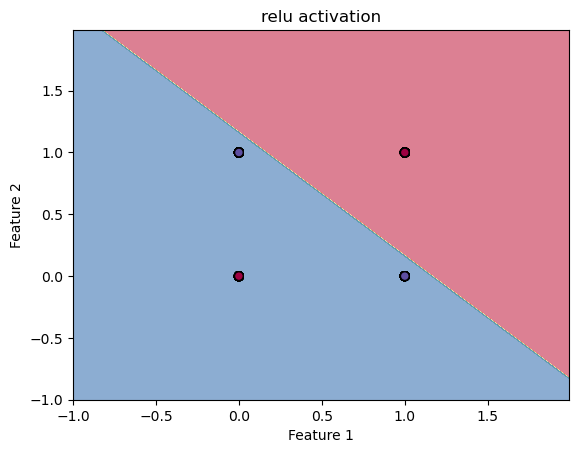


Running experiment with leaky_relu activation
Activation: leaky_relu, Test Accuracy: 0.7267
2813/2813 [==============================] - 2s 764us/step


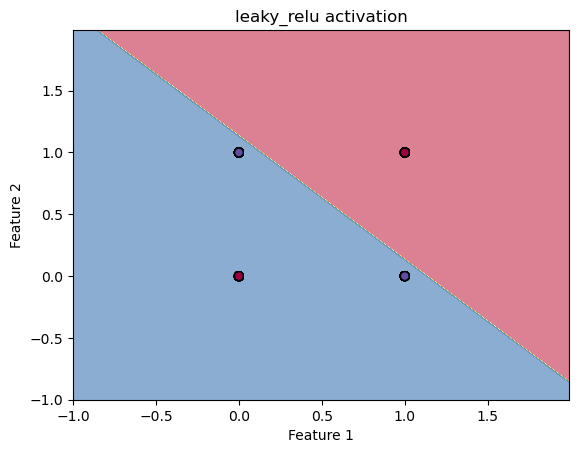


Running experiment with elu activation
Activation: elu, Test Accuracy: 0.5500
2813/2813 [==============================] - 2s 732us/step


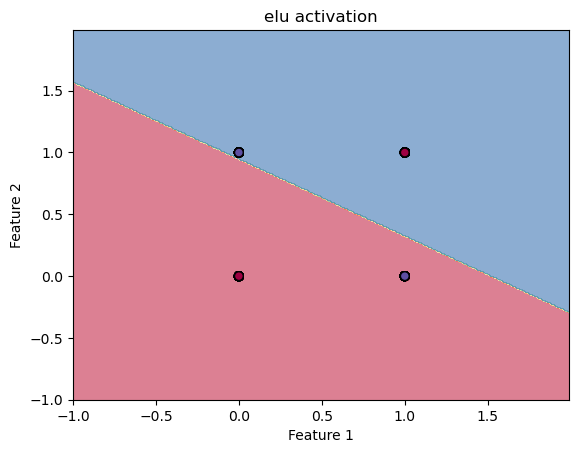


Running experiment with softplus activation
Activation: softplus, Test Accuracy: 0.5067
2813/2813 [==============================] - 2s 813us/step


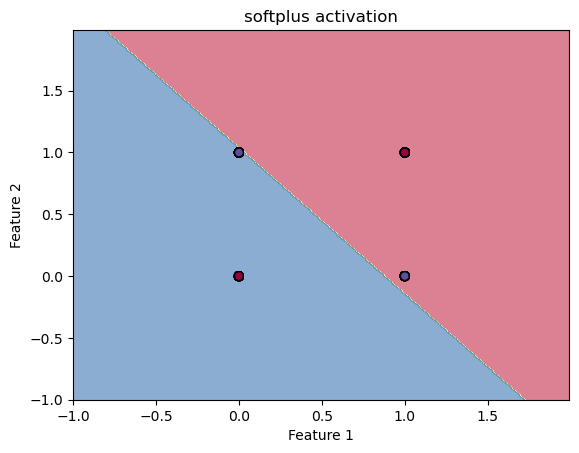


Running experiment with swish activation
Activation: swish, Test Accuracy: 0.7700
2813/2813 [==============================] - 2s 766us/step


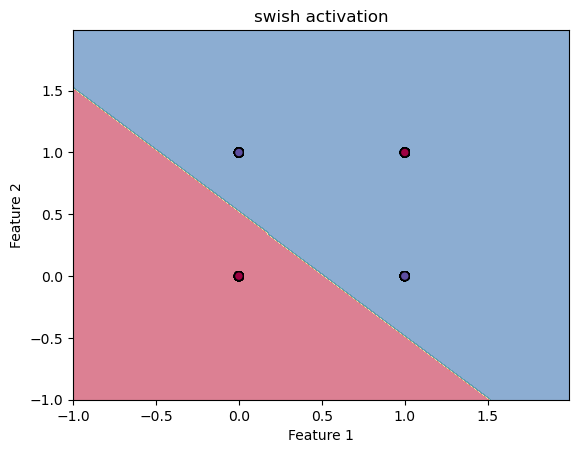


Running experiment with mish activation
Activation: mish, Test Accuracy: 0.7267
2813/2813 [==============================] - 2s 748us/step


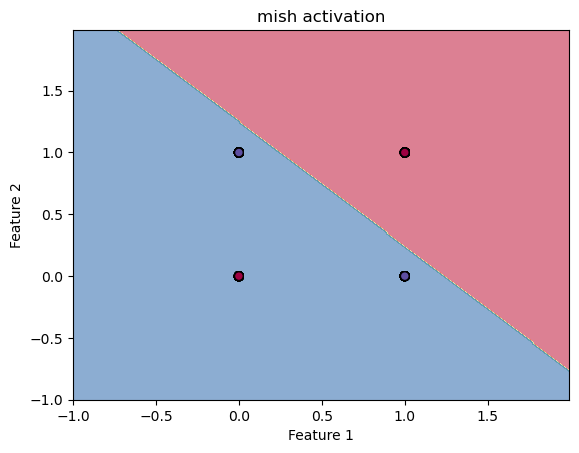


Running experiment with gelu activation
Activation: gelu, Test Accuracy: 0.7800
2813/2813 [==============================] - 2s 790us/step


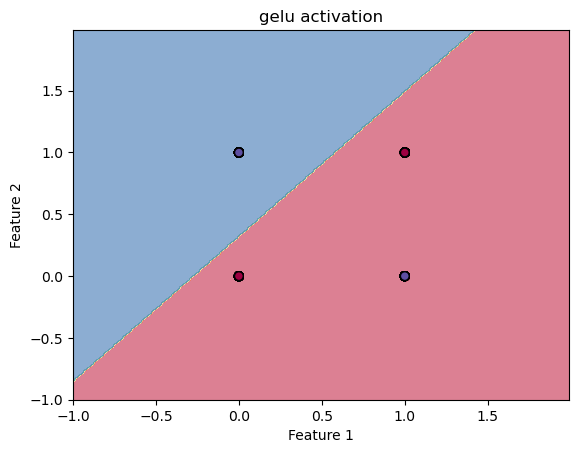

In [49]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


def mish(x):
    return x * tf.math.tanh(tf.math.softplus(x))


def make_xor(n_samples):
    X = np.random.rand(n_samples, 2) > 0.5
    y = np.logical_xor(X[:, 0], X[:, 1]).astype(int)
    return X, y


X_xor, y_xor = make_xor(n_samples=1500)
X_train, X_test, y_train, y_test = train_test_split(X_xor, y_xor, test_size=0.2, random_state=42)

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))])
    
    for i, units in enumerate(hidden_units):
        model.add(layers.Dense(units, name=f'dense_{i}'))
        if activation == 'mish':
            model.add(layers.Lambda(mish))
        else:
            model.add(layers.Activation(activation))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int) 
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

def run_experiment(activation):
    H = [1]
    learning_rate = 0.001
    epochs = 60
    batch_size = 32

    model = create_model(activation, H)

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Activation: {activation}, Test Accuracy: {test_accuracy:.4f}")

    plot_decision_boundary(X_test, y_test, model, f'{activation} activation')

activations = ['relu', 'leaky_relu', 'elu', 'softplus', 'swish', 'mish', 'gelu']

for activation in activations:
    print(f"\nRunning experiment with {activation} activation")
    run_experiment(activation)


##  6.Nested squares or rectangles

## LASA

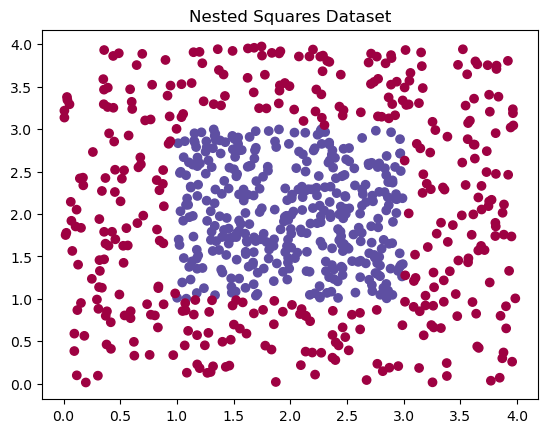


Running experiment with LASA...
Epoch 1/60, Avg Loss: 0.6755, Test Accuracy: 0.6107
Epoch 11/60, Avg Loss: 0.3833, Test Accuracy: 0.8523
Epoch 21/60, Avg Loss: 0.2416, Test Accuracy: 0.9463
Epoch 31/60, Avg Loss: 0.2061, Test Accuracy: 0.9463
Epoch 41/60, Avg Loss: 0.1887, Test Accuracy: 0.9463
Epoch 51/60, Avg Loss: 0.1772, Test Accuracy: 0.9597
Final Test Accuracy: 0.9597
Layer 1 - Initial k: 1.6, Final k: 1.4464
10989/10989 [==============================] - 8s 769us/step


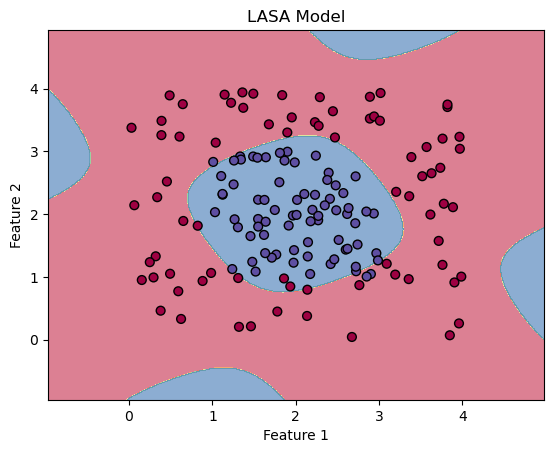


Summary of Results:
Final Test Accuracy: 0.9597


In [71]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


class SineActivation(tf.keras.layers.Layer):
    def __init__(self, initial_frequency, **kwargs):
        super().__init__(**kwargs)
        self.initial_frequency = initial_frequency
    
    def build(self, input_shape):
        self.freq = self.add_weight(shape=(), 
                                    initializer=tf.keras.initializers.Constant(self.initial_frequency),
                                    trainable=True, 
                                    name='freq')
    
    def call(self, inputs):
        return tf.math.sin(self.freq * inputs)


def make_nested_squares(n_samples, outer_square_size=4.0, inner_square_size=2.0):
   
    X = np.random.rand(n_samples * 2, 2) * outer_square_size  
    half_inner_size = inner_square_size / 2.0
    half_outer_size = outer_square_size / 2.0

  
    inside_inner_square = (
        (X[:, 0] > (half_outer_size - half_inner_size)) & 
        (X[:, 0] < (half_outer_size + half_inner_size)) &
        (X[:, 1] > (half_outer_size - half_inner_size)) & 
        (X[:, 1] < (half_outer_size + half_inner_size))
    )
    
    y = np.where(inside_inner_square, 1, 0)  
    
   
    X_inner = X[inside_inner_square]
    X_outer = X[~inside_inner_square]
    
    n_class_samples = min(len(X_inner), len(X_outer))
    
    X_balanced = np.vstack([X_inner[:n_class_samples], X_outer[:n_class_samples]])
    y_balanced = np.hstack([np.ones(n_class_samples), np.zeros(n_class_samples)])
    
    return X_balanced, y_balanced


X_nested, y_nested = make_nested_squares(n_samples=750, outer_square_size=4.0, inner_square_size=2.0)  # 750 from each class
X_train, X_test, y_train, y_test = train_test_split(X_nested, y_nested, test_size=0.2, random_state=42, stratify=y_nested)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.show()

def create_model(activation, hidden_units, k_values):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    sine_layers_k = []
    for i, units in enumerate(hidden_units):
        if (activation == 'sine'):
            model.add(layers.Dense(units, name=f'dense_{i}'))
            sine_activation_layer = SineActivation(initial_frequency=k_values[i], name=f'sine_{i}')
            model.add(sine_activation_layer)
            sine_layers_k.append(sine_activation_layer)
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model, sine_layers_k

def train_step(model, x_batch, y_batch, optimizer_main, optimizer_k):
    y_batch = tf.expand_dims(y_batch, axis=1)  
    with tf.GradientTape() as tape:
        predictions = model(x_batch, training=True)
        loss = tf.keras.losses.binary_crossentropy(y_batch, predictions)
        loss = tf.reduce_mean(loss)
    
    grads = tape.gradient(loss, model.trainable_variables)
    
    k_vars = [v for v in model.trainable_variables if 'freq' in v.name]
    other_vars = [v for v in model.trainable_variables if 'freq' not in v.name]
    
    k_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' in v.name]
    other_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' not in v.name]
    
    optimizer_k.apply_gradients(zip(k_grads, k_vars))
    optimizer_main.apply_gradients(zip(other_grads, other_vars))
    
    return loss


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()


def run_experiment():
    H = [2]  
    K = [1.6]  
    learning_rate_main = 0.01
    learning_rate_k = 0.01
    epochs = 60
    batch_size = 32

    model, sine_layers_k = create_model('sine', H, K)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    optimizer_main = Adam(learning_rate=learning_rate_main)
    optimizer_k = Adam(learning_rate=learning_rate_k)

    for epoch in range(epochs):
        total_loss = 0.0
        num_batches = 0
        for i in range(0, len(X_train), batch_size):
            x_batch = X_train[i:i+batch_size]
            y_batch = y_train[i:i+batch_size]
            
            batch_loss = train_step(model, x_batch, y_batch, optimizer_main, optimizer_k)
            total_loss += batch_loss.numpy()
            num_batches += 1
        
        avg_loss = total_loss / num_batches
        
        if epoch % 10 == 0:
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            print(f"Epoch {epoch+1}/{epochs}, Avg Loss: {avg_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")

    for i, layer in enumerate(sine_layers_k):
        print(f"Layer {i+1} - Initial k: {K[i]}, Final k: {layer.freq.numpy():.4f}")
    

    plot_decision_boundary(X_test, y_test, model, 'LASA Model')

    return test_accuracy

plot_dataset(X_nested, y_nested, "Nested Squares Dataset")

print(f"\nRunning experiment with LASA...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")



Running experiment with relu activation
Activation: relu, Test Accuracy: 0.7086
11026/11026 [==============================] - 9s 789us/step


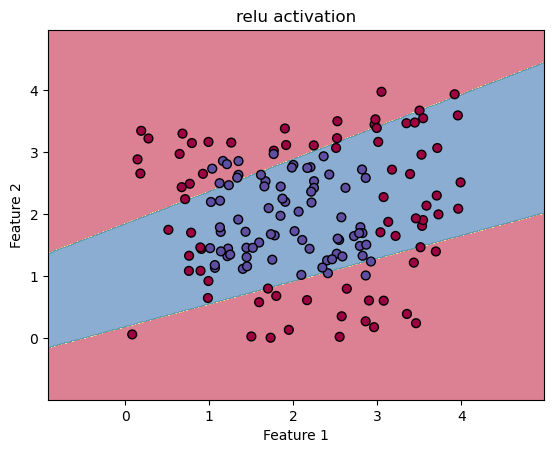


Running experiment with leaky_relu activation
Activation: leaky_relu, Test Accuracy: 0.6821
11026/11026 [==============================] - 12s 1ms/step


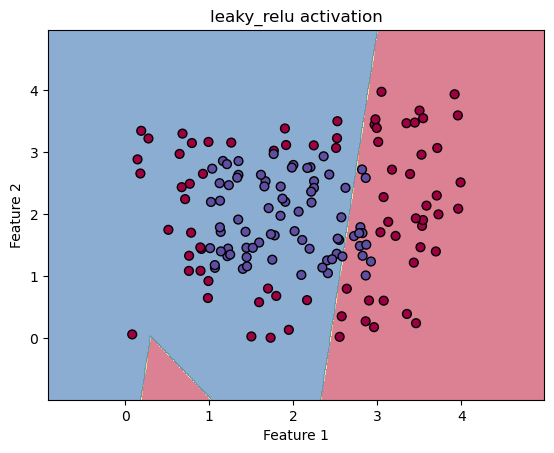


Running experiment with elu activation
Activation: elu, Test Accuracy: 0.4967
11026/11026 [==============================] - 11s 1ms/step


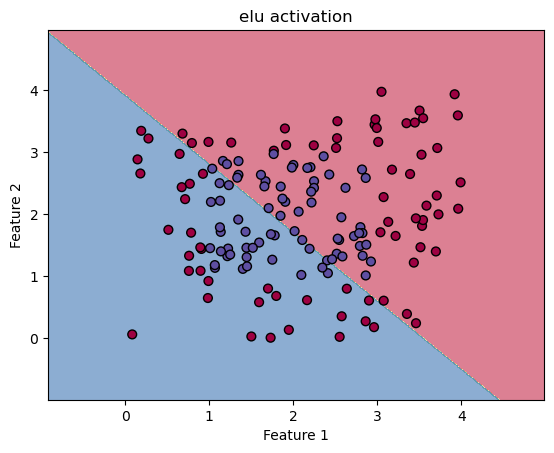


Running experiment with softplus activation
Activation: softplus, Test Accuracy: 0.6821
11026/11026 [==============================] - 10s 872us/step


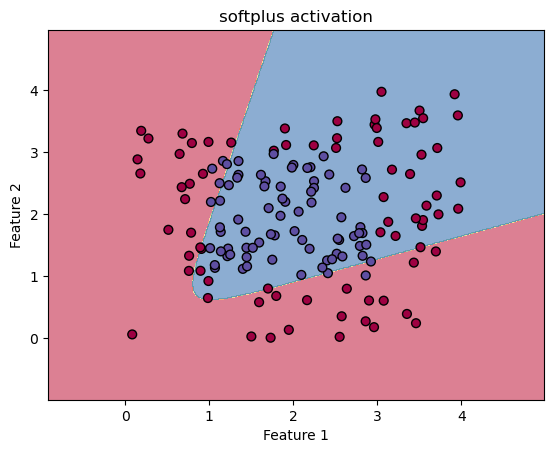


Running experiment with swish activation
Activation: swish, Test Accuracy: 0.7152
11026/11026 [==============================] - 10s 915us/step


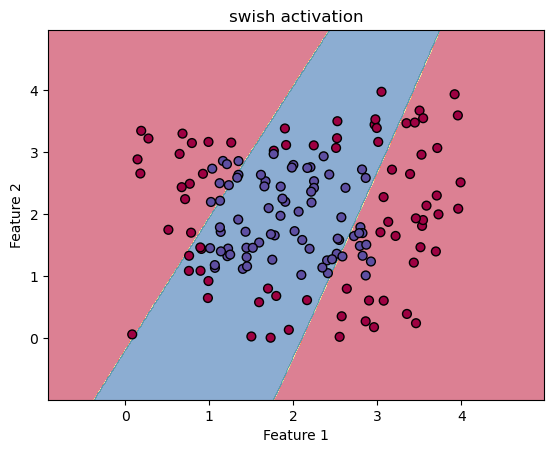


Running experiment with mish activation
Activation: mish, Test Accuracy: 0.7219
11026/11026 [==============================] - 10s 881us/step


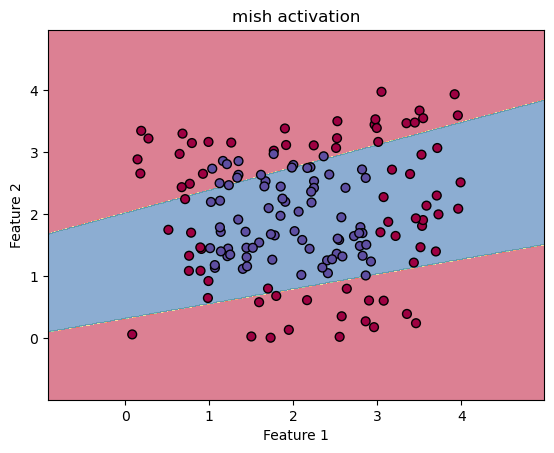


Running experiment with gelu activation
Activation: gelu, Test Accuracy: 0.7219
11026/11026 [==============================] - 11s 958us/step


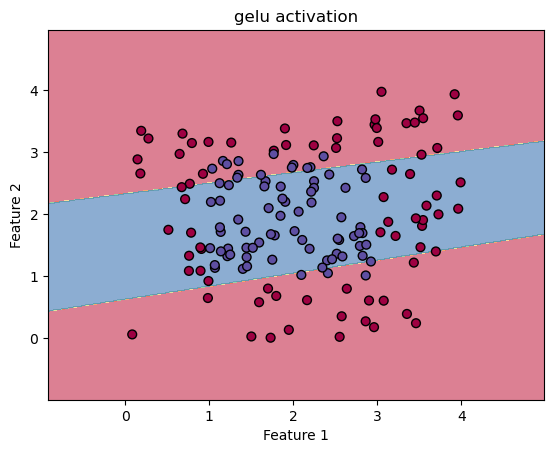

In [72]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


def mish(x):
    return x * tf.math.tanh(tf.math.softplus(x))


def make_nested_squares(n_samples, outer_square_size=4.0, inner_square_size=2.0):
 
    X = np.random.rand(n_samples * 2, 2) * outer_square_size  
    half_inner_size = inner_square_size / 2.0
    half_outer_size = outer_square_size / 2.0

  
    inside_inner_square = (
        (X[:, 0] > (half_outer_size - half_inner_size)) & 
        (X[:, 0] < (half_outer_size + half_inner_size)) &
        (X[:, 1] > (half_outer_size - half_inner_size)) & 
        (X[:, 1] < (half_outer_size + half_inner_size))
    )
    
    y = np.where(inside_inner_square, 1, 0)
    
  
    X_inner = X[inside_inner_square]
    X_outer = X[~inside_inner_square]
    
    n_class_samples = min(len(X_inner), len(X_outer))
    
    X_balanced = np.vstack([X_inner[:n_class_samples], X_outer[:n_class_samples]])
    y_balanced = np.hstack([np.ones(n_class_samples), np.zeros(n_class_samples)])
    
    return X_balanced, y_balanced


X_nested, y_nested = make_nested_squares(n_samples=750, outer_square_size=4.0, inner_square_size=2.0)  # 750 from each class
X_train, X_test, y_train, y_test = train_test_split(X_nested, y_nested, test_size=0.2, random_state=42, stratify=y_nested)

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))])
    
    for i, units in enumerate(hidden_units):
        model.add(layers.Dense(units, name=f'dense_{i}'))
        if activation == 'mish':
            model.add(layers.Lambda(mish))
        else:
            model.add(layers.Activation(activation))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

def run_experiment(activation):
    H = [2]
    learning_rate = 0.01
    epochs = 60
    batch_size = 32

    model = create_model(activation, H)

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Activation: {activation}, Test Accuracy: {test_accuracy:.4f}")

    plot_decision_boundary(X_test, y_test, model, f'{activation} activation')

activations = ['relu', 'leaky_relu', 'elu', 'softplus', 'swish', 'mish', 'gelu']

for activation in activations:
    print(f"\nRunning experiment with {activation} activation")
    run_experiment(activation)


## SINE

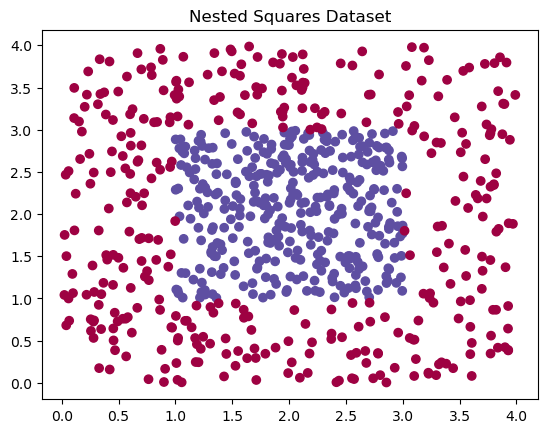


Running experiment with standard sine activation...
Epoch 1/60, Loss: 0.7160, Test Accuracy: 0.5625
Epoch 11/60, Loss: 0.5732, Test Accuracy: 0.6736
Epoch 21/60, Loss: 0.4793, Test Accuracy: 0.7917
Epoch 31/60, Loss: 0.4173, Test Accuracy: 0.8472
Epoch 41/60, Loss: 0.3710, Test Accuracy: 0.8819
Epoch 51/60, Loss: 0.3379, Test Accuracy: 0.9375
Final Test Accuracy: 0.9375
11026/11026 [==============================] - 17s 2ms/step


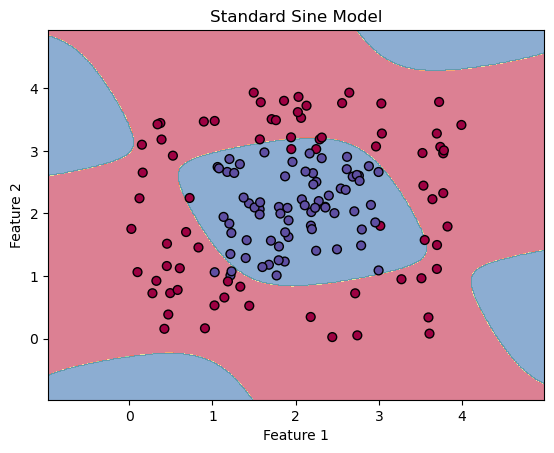


Summary of Results:
Final Test Accuracy: 0.9375


In [5]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


class SineActivation(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
    
    def call(self, inputs):
        return tf.math.sin(inputs)


def make_nested_squares(n_samples, outer_square_size=4.0, inner_square_size=2.0):
   
    X = np.random.rand(n_samples * 2, 2) * outer_square_size  
    half_inner_size = inner_square_size / 2.0
    half_outer_size = outer_square_size / 2.0

  
    inside_inner_square = (
        (X[:, 0] > (half_outer_size - half_inner_size)) & 
        (X[:, 0] < (half_outer_size + half_inner_size)) &
        (X[:, 1] > (half_outer_size - half_inner_size)) & 
        (X[:, 1] < (half_outer_size + half_inner_size))
    )
    
    y = np.where(inside_inner_square, 1, 0)  
    
   
    X_inner = X[inside_inner_square]
    X_outer = X[~inside_inner_square]
    
    n_class_samples = min(len(X_inner), len(X_outer))
    
    X_balanced = np.vstack([X_inner[:n_class_samples], X_outer[:n_class_samples]])
    y_balanced = np.hstack([np.ones(n_class_samples), np.zeros(n_class_samples)])
    
    return X_balanced, y_balanced


X_nested, y_nested = make_nested_squares(n_samples=750, outer_square_size=4.0, inner_square_size=2.0)  # 750 from each class
X_train, X_test, y_train, y_test = train_test_split(X_nested, y_nested, test_size=0.2, random_state=42, stratify=y_nested)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.show()

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    for i, units in enumerate(hidden_units):
        if activation == 'sine':
            model.add(layers.Dense(units, name=f'dense_{i}'))
            model.add(SineActivation(name=f'sine_{i}'))
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int) 
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()


def run_experiment():
    H = [2]  
    learning_rate = 0.01
    epochs = 60
    batch_size = 32


    model = create_model('sine', H)
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy', 
        metrics=['accuracy']
    )


    history = model.fit(
        X_train, y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(X_test, y_test),
        verbose=0
    )
    

    for epoch in range(0, epochs, 10):
        print(f"Epoch {epoch+1}/{epochs}, Loss: {history.history['loss'][epoch]:.4f}, "
              f"Test Accuracy: {history.history['val_accuracy'][epoch]:.4f}")

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")
    

    plot_decision_boundary(X_test, y_test, model, 'Standard Sine Model')

    return test_accuracy


plot_dataset(X_nested, y_nested, "Nested Squares Dataset")

print(f"\nRunning experiment with standard sine activation...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")

## 7.Yin Yang

### LASA

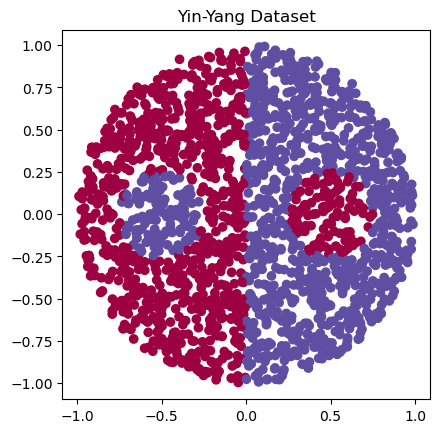


Running experiment with LASA...
Epoch 1/60, Avg Loss: 0.5992, Test Accuracy: 0.7225
Epoch 11/60, Avg Loss: 0.3601, Test Accuracy: 0.8175
Epoch 21/60, Avg Loss: 0.1913, Test Accuracy: 0.9350
Epoch 31/60, Avg Loss: 0.1399, Test Accuracy: 0.9650
Epoch 41/60, Avg Loss: 0.1041, Test Accuracy: 0.9800
Epoch 51/60, Avg Loss: 0.0891, Test Accuracy: 0.9825
Final Test Accuracy: 0.9825
Layer 1 - Initial k: 1.6, Final k: 10.5670
4901/4901 [==============================] - 4s 850us/step


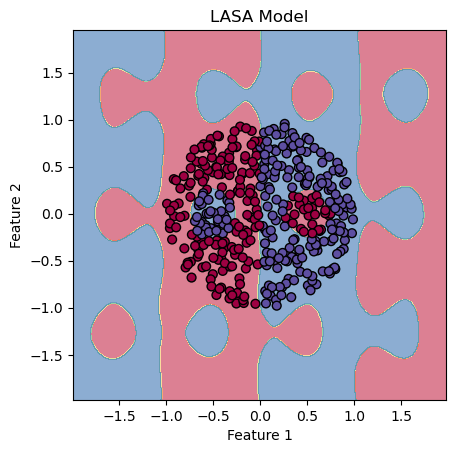


Summary of Results:
Final Test Accuracy: 0.9825


In [6]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split


class SineActivation(tf.keras.layers.Layer):
    def __init__(self, initial_frequency, **kwargs):
        super().__init__(**kwargs)
        self.initial_frequency = initial_frequency
    
    def build(self, input_shape):
        self.freq = self.add_weight(shape=(), 
                                    initializer=tf.keras.initializers.Constant(self.initial_frequency),
                                    trainable=True, 
                                    name='freq')
    
    def call(self, inputs):
        return tf.math.sin(self.freq * inputs)


def generate_yin_yang(num_points=1000, radius=1.0):
  
    theta = np.random.rand(num_points) * 2 * np.pi
    r = radius * np.sqrt(np.random.rand(num_points))
    x = r * np.cos(theta)
    y = r * np.sin(theta)


    labels = np.zeros(num_points)


    yin_mask = (x**2 + y**2 <= (radius**2)) & (x <= 0)
    labels[yin_mask] = 0


    yang_mask = (x**2 + y**2 <= (radius**2)) & (x > 0)
    labels[yang_mask] = 1


    small_yin_mask = ((x - radius/2)**2 + y**2 <= (radius/4)**2)
    labels[small_yin_mask] = 0

    small_yang_mask = ((x + radius/2)**2 + y**2 <= (radius/4)**2)
    labels[small_yang_mask] = 1

    return np.vstack([x, y]).T, labels


X_yin_yang, y_yin_yang = generate_yin_yang(num_points=2000)
X_train, X_test, y_train, y_test = train_test_split(X_yin_yang, y_yin_yang, test_size=0.2, random_state=42, stratify=y_yin_yang)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

def create_model(activation, hidden_units, k_values):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    sine_layers_k = []
    for i, units in enumerate(hidden_units):
        if activation == 'sine':
            model.add(layers.Dense(units, name=f'dense_{i}'))
            sine_activation_layer = SineActivation(initial_frequency=k_values[i], name=f'sine_{i}')
            model.add(sine_activation_layer)
            sine_layers_k.append(sine_activation_layer)
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model, sine_layers_k

def train_step(model, x_batch, y_batch, optimizer_main, optimizer_k):
    y_batch = tf.expand_dims(y_batch, axis=1)  
    with tf.GradientTape() as tape:
        predictions = model(x_batch, training=True)
        loss = tf.keras.losses.binary_crossentropy(y_batch, predictions)
        loss = tf.reduce_mean(loss)
    
    grads = tape.gradient(loss, model.trainable_variables)
    
    k_vars = [v for v in model.trainable_variables if 'freq' in v.name]
    other_vars = [v for v in model.trainable_variables if 'freq' not in v.name]
    
    k_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' in v.name]
    other_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' not in v.name]
    
    optimizer_k.apply_gradients(zip(k_grads, k_vars))
    optimizer_main.apply_gradients(zip(other_grads, other_vars))
    
    return loss


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()


def run_experiment():
    H = [16]  
    K = [1.6]  
    learning_rate_main = 0.001
    learning_rate_k = 0.1
    epochs = 60
    batch_size = 32

    model, sine_layers_k = create_model('sine', H, K)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    optimizer_main = Adam(learning_rate=learning_rate_main)
    optimizer_k = Adam(learning_rate=learning_rate_k)

    for epoch in range(epochs):
        total_loss = 0.0
        num_batches = 0
        for i in range(0, len(X_train), batch_size):
            x_batch = X_train[i:i+batch_size]
            y_batch = y_train[i:i+batch_size]
            
            batch_loss = train_step(model, x_batch, y_batch, optimizer_main, optimizer_k)
            total_loss += batch_loss.numpy()
            num_batches += 1
        
        avg_loss = total_loss / num_batches
        
        if epoch % 10 == 0:
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            print(f"Epoch {epoch+1}/{epochs}, Avg Loss: {avg_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")

    for i, layer in enumerate(sine_layers_k):
        print(f"Layer {i+1} - Initial k: {K[i]}, Final k: {layer.freq.numpy():.4f}")
    
   
    plot_decision_boundary(X_test, y_test, model, 'LASA Model')

    return test_accuracy

plot_dataset(X_yin_yang, y_yin_yang, "Yin-Yang Dataset")

print(f"\nRunning experiment with LASA...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")


### All Activations


Running experiment with relu activation
Activation: relu, Test Accuracy: 0.8500
4876/4876 [==============================] - 5s 1ms/step


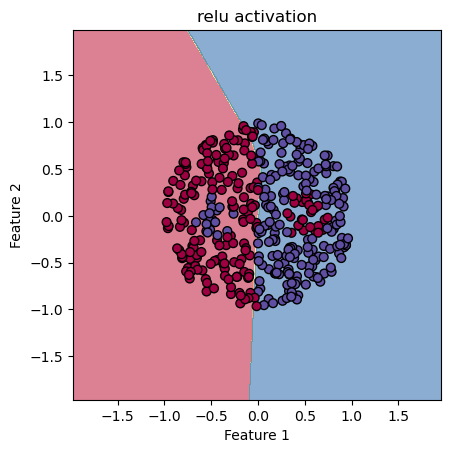


Running experiment with leaky_relu activation
Activation: leaky_relu, Test Accuracy: 0.8375
4876/4876 [==============================] - 5s 962us/step


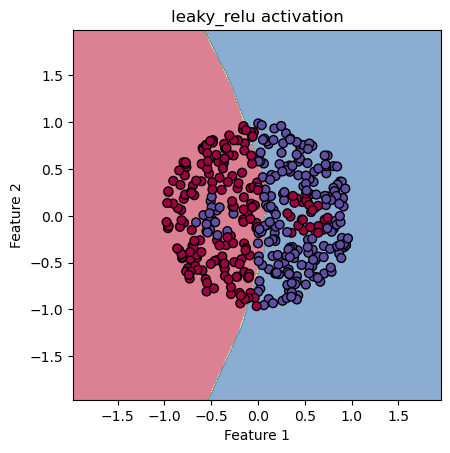


Running experiment with elu activation
Activation: elu, Test Accuracy: 0.8725
4876/4876 [==============================] - 4s 740us/step


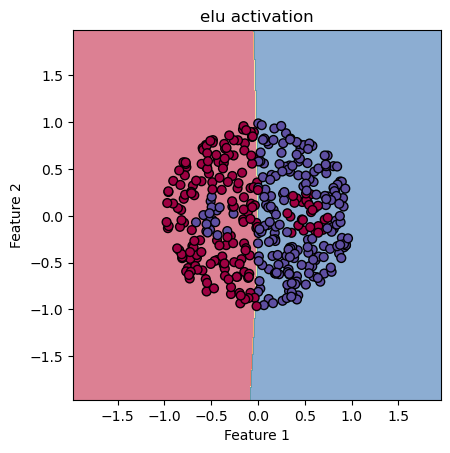


Running experiment with softplus activation
Activation: softplus, Test Accuracy: 0.8675
4876/4876 [==============================] - 4s 812us/step


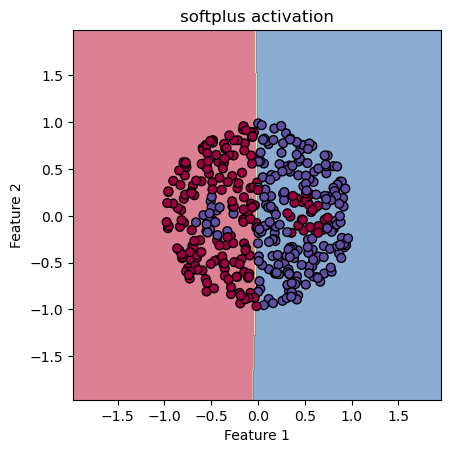


Running experiment with swish activation
Activation: swish, Test Accuracy: 0.8650
4876/4876 [==============================] - 4s 760us/step


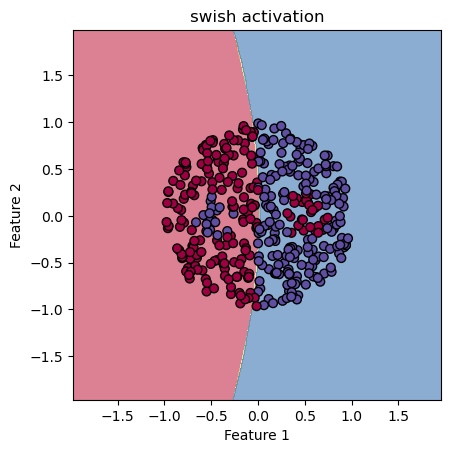


Running experiment with mish activation
Activation: mish, Test Accuracy: 0.8675
4876/4876 [==============================] - 4s 802us/step


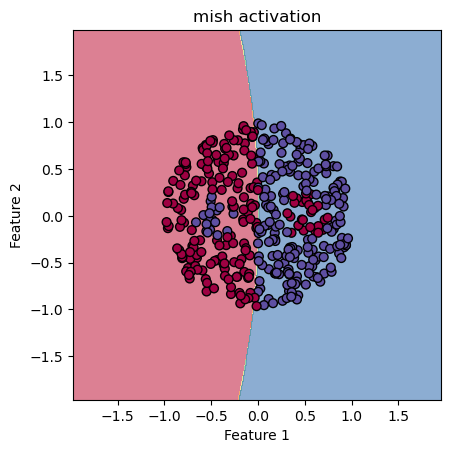


Running experiment with gelu activation
Activation: gelu, Test Accuracy: 0.8650
4876/4876 [==============================] - 4s 891us/step


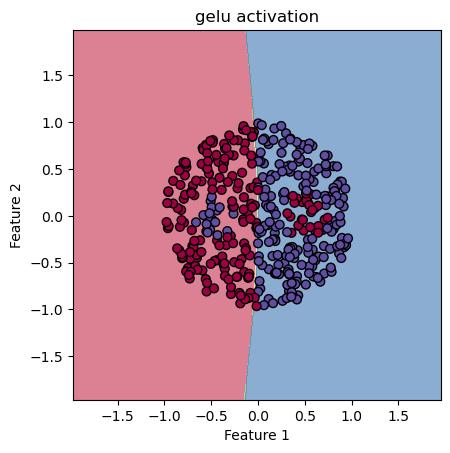

In [2]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


def mish(x):
    return x * tf.math.tanh(tf.math.softplus(x))


def generate_yin_yang(num_points=1000, radius=1.0):
  
    theta = np.random.rand(num_points) * 2 * np.pi
    r = radius * np.sqrt(np.random.rand(num_points))
    x = r * np.cos(theta)
    y = r * np.sin(theta)


    labels = np.zeros(num_points)

    yin_mask = (x**2 + y**2 <= (radius**2)) & (x <= 0)
    labels[yin_mask] = 0


    yang_mask = (x**2 + y**2 <= (radius**2)) & (x > 0)
    labels[yang_mask] = 1


    small_yin_mask = ((x - radius/2)**2 + y**2 <= (radius/4)**2)
    labels[small_yin_mask] = 0


    small_yang_mask = ((x + radius/2)**2 + y**2 <= (radius/4)**2)
    labels[small_yang_mask] = 1

    return np.vstack([x, y]).T, labels


X_yin_yang, y_yin_yang = generate_yin_yang(num_points=2000)
X_train, X_test, y_train, y_test = train_test_split(X_yin_yang, y_yin_yang, test_size=0.2, random_state=42, stratify=y_yin_yang)

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))])
    
    for i, units in enumerate(hidden_units):
        model.add(layers.Dense(units, name=f'dense_{i}'))
        if activation == 'mish':
            model.add(layers.Lambda(mish))
        else:
            model.add(layers.Activation(activation))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

def run_experiment(activation):
    H = [16]
    learning_rate = 0.001
    epochs = 60
    batch_size = 32

    model = create_model(activation, H)

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Activation: {activation}, Test Accuracy: {test_accuracy:.4f}")

    plot_decision_boundary(X_test, y_test, model, f'{activation} activation')

activations = ['relu', 'leaky_relu', 'elu', 'softplus', 'swish', 'mish', 'gelu']

for activation in activations:
    print(f"\nRunning experiment with {activation} activation")
    run_experiment(activation)


## SINE

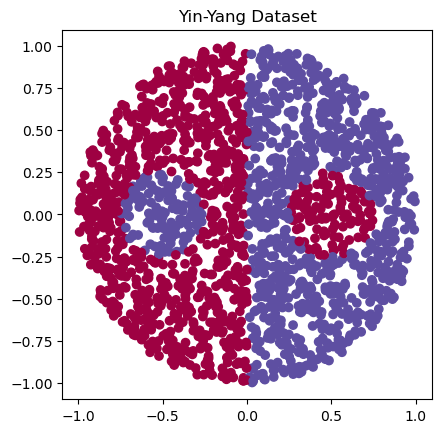


Running experiment with standard sine activation...
Epoch 1/60, Loss: 0.6244, Test Accuracy: 0.7275
Epoch 11/60, Loss: 0.4898, Test Accuracy: 0.8450
Epoch 21/60, Loss: 0.4888, Test Accuracy: 0.8400
Epoch 31/60, Loss: 0.4885, Test Accuracy: 0.8400
Epoch 41/60, Loss: 0.4883, Test Accuracy: 0.8400
Epoch 51/60, Loss: 0.4879, Test Accuracy: 0.8425
Final Test Accuracy: 0.8400
4852/4852 [==============================] - 5s 1ms/step


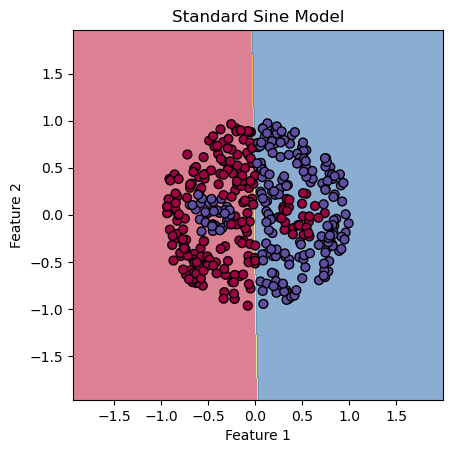


Summary of Results:
Final Test Accuracy: 0.8400


In [6]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split


class SineActivation(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
    
    def call(self, inputs):
        return tf.math.sin(inputs)


def generate_yin_yang(num_points=1000, radius=1.0):

    theta = np.random.rand(num_points) * 2 * np.pi
    r = radius * np.sqrt(np.random.rand(num_points))
    x = r * np.cos(theta)
    y = r * np.sin(theta)

    labels = np.zeros(num_points)


    yin_mask = (x**2 + y**2 <= (radius**2)) & (x <= 0)
    labels[yin_mask] = 0


    yang_mask = (x**2 + y**2 <= (radius**2)) & (x > 0)
    labels[yang_mask] = 1


    small_yin_mask = ((x - radius/2)**2 + y**2 <= (radius/4)**2)
    labels[small_yin_mask] = 0


    small_yang_mask = ((x + radius/2)**2 + y**2 <= (radius/4)**2)
    labels[small_yang_mask] = 1

    return np.vstack([x, y]).T, labels


X_yin_yang, y_yin_yang = generate_yin_yang(num_points=2000)
X_train, X_test, y_train, y_test = train_test_split(X_yin_yang, y_yin_yang, test_size=0.2, random_state=42, stratify=y_yin_yang)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    for i, units in enumerate(hidden_units):
        if activation == 'sine':
            model.add(layers.Dense(units, name=f'dense_{i}'))
            model.add(SineActivation(name=f'sine_{i}'))
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()


def run_experiment():
   
    H = [16]  
    learning_rate = 0.001
    epochs = 60
    batch_size = 32

 
    model = create_model('sine', H)
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy', 
        metrics=['accuracy']
    )

 
    history = model.fit(
        X_train, y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(X_test, y_test),
        verbose=0
    )
    

    for epoch in range(0, epochs, 10):
        print(f"Epoch {epoch+1}/{epochs}, Loss: {history.history['loss'][epoch]:.4f}, "
              f"Test Accuracy: {history.history['val_accuracy'][epoch]:.4f}")


    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")
    

    plot_decision_boundary(X_test, y_test, model, 'Standard Sine Model')

    return test_accuracy


plot_dataset(X_yin_yang, y_yin_yang, "Yin-Yang Dataset")

print(f"\nRunning experiment with standard sine activation...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")

## 8.Flower

### LASA

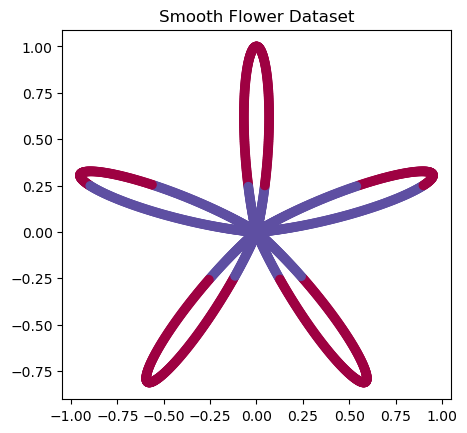


Running experiment with LASA...
Epoch 1/60, Avg Loss: 0.7009, Test Accuracy: 0.7475
Epoch 11/60, Avg Loss: 0.3936, Test Accuracy: 0.8875
Epoch 21/60, Avg Loss: 0.2514, Test Accuracy: 0.9025
Epoch 31/60, Avg Loss: 0.1988, Test Accuracy: 0.9425
Epoch 41/60, Avg Loss: 0.1673, Test Accuracy: 0.9575
Epoch 51/60, Avg Loss: 0.1458, Test Accuracy: 0.9625
Final Test Accuracy: 0.9700
Layer 1 - Initial k: 1.6, Final k: -5.3872
4656/4656 [==============================] - 3s 705us/step


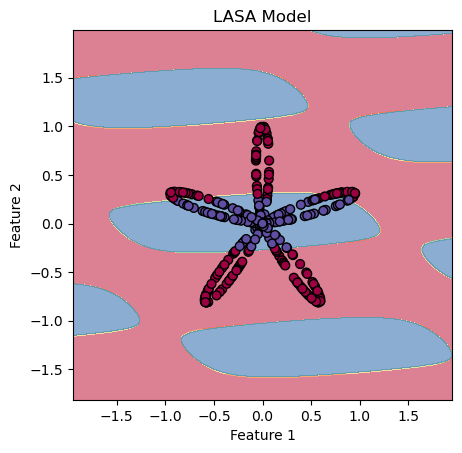


Summary of Results:
Final Test Accuracy: 0.9700


In [13]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split


class SineActivation(tf.keras.layers.Layer):
    def __init__(self, initial_frequency, **kwargs):
        super().__init__(**kwargs)
        self.initial_frequency = initial_frequency
    
    def build(self, input_shape):
        self.freq = self.add_weight(shape=(), 
                                    initializer=tf.keras.initializers.Constant(self.initial_frequency),
                                    trainable=True, 
                                    name='freq')
    
    def call(self, inputs):
        return tf.math.sin(self.freq * inputs)


def generate_smooth_flower(n_samples=1000):
    t = np.linspace(0, 2*np.pi, n_samples)
    r = np.sin(5*t)**3
    X = np.column_stack((r * np.cos(t), r * np.sin(t)))
    y = np.where(np.abs(X[:, 1]) > 0.25, 0, 1)
    return X, y


X_smooth_flower, y_smooth_flower = generate_smooth_flower(n_samples=2000)
X_train, X_test, y_train, y_test = train_test_split(X_smooth_flower, y_smooth_flower, test_size=0.2, random_state=42, stratify=y_smooth_flower)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

def create_model(activation, hidden_units, k_values):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    sine_layers_k = []
    for i, units in enumerate(hidden_units):
        if activation == 'sine':
            model.add(layers.Dense(units, name=f'dense_{i}'))
            sine_activation_layer = SineActivation(initial_frequency=k_values[i], name=f'sine_{i}')
            model.add(sine_activation_layer)
            sine_layers_k.append(sine_activation_layer)
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model, sine_layers_k

def train_step(model, x_batch, y_batch, optimizer_main, optimizer_k):
    y_batch = tf.expand_dims(y_batch, axis=1)  
    with tf.GradientTape() as tape:
        predictions = model(x_batch, training=True)
        loss = tf.keras.losses.binary_crossentropy(y_batch, predictions)
        loss = tf.reduce_mean(loss)
    
    grads = tape.gradient(loss, model.trainable_variables)
    
    k_vars = [v for v in model.trainable_variables if 'freq' in v.name]
    other_vars = [v for v in model.trainable_variables if 'freq' not in v.name]
    
    k_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' in v.name]
    other_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' not in v.name]
    
    optimizer_k.apply_gradients(zip(k_grads, k_vars))
    optimizer_main.apply_gradients(zip(other_grads, other_vars))
    
    return loss


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()


def run_experiment():
    H = [2]  
    K = [1.6]  
    learning_rate_main = 0.001
    learning_rate_k = 0.1
    epochs = 60
    batch_size = 32

    model, sine_layers_k = create_model('sine', H, K)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    optimizer_main = Adam(learning_rate=learning_rate_main)
    optimizer_k = Adam(learning_rate=learning_rate_k)

    for epoch in range(epochs):
        total_loss = 0.0
        num_batches = 0
        for i in range(0, len(X_train), batch_size):
            x_batch = X_train[i:i+batch_size]
            y_batch = y_train[i:i+batch_size]
            
            batch_loss = train_step(model, x_batch, y_batch, optimizer_main, optimizer_k)
            total_loss += batch_loss.numpy()
            num_batches += 1
        
        avg_loss = total_loss / num_batches
        
        if epoch % 10 == 0:
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            print(f"Epoch {epoch+1}/{epochs}, Avg Loss: {avg_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")

    for i, layer in enumerate(sine_layers_k):
        print(f"Layer {i+1} - Initial k: {K[i]}, Final k: {layer.freq.numpy():.4f}")
    
    # Plot the decision boundary
    plot_decision_boundary(X_test, y_test, model, 'LASA Model')

    return test_accuracy

plot_dataset(X_smooth_flower, y_smooth_flower, "Smooth Flower Dataset")

print(f"\nRunning experiment with LASA...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")


### All Activations


Running experiment with relu activation
Activation: relu, Test Accuracy: 0.8025
4656/4656 [==============================] - 5s 985us/step


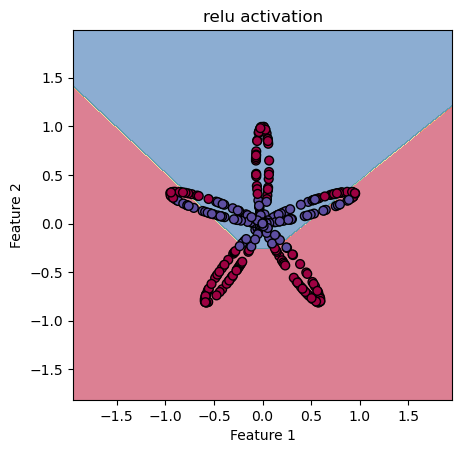


Running experiment with leaky_relu activation
Activation: leaky_relu, Test Accuracy: 0.5775
4656/4656 [==============================] - 4s 929us/step


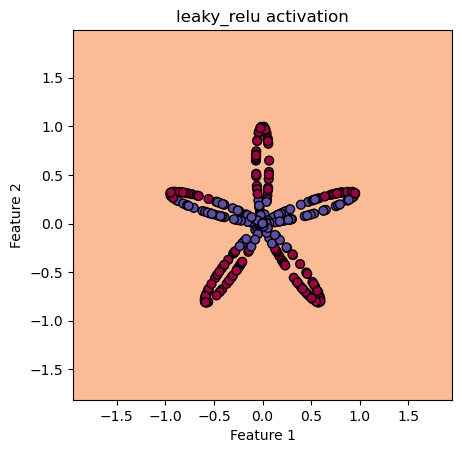


Running experiment with elu activation
Activation: elu, Test Accuracy: 0.5775
4656/4656 [==============================] - 4s 933us/step


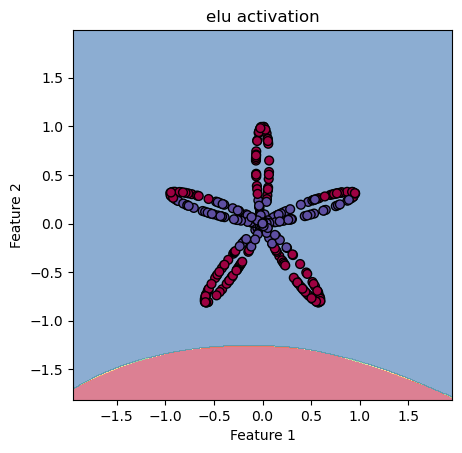


Running experiment with softplus activation
Activation: softplus, Test Accuracy: 0.7700
4656/4656 [==============================] - 4s 884us/step


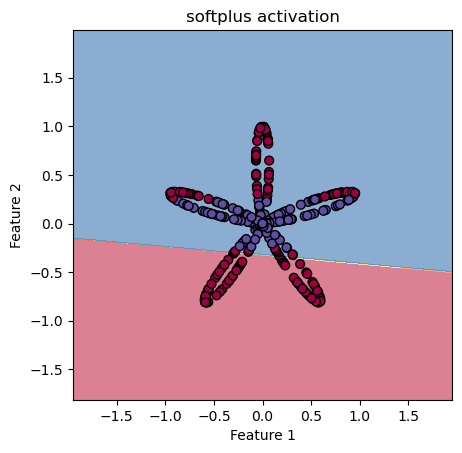


Running experiment with swish activation
Activation: swish, Test Accuracy: 0.8125
4656/4656 [==============================] - 3s 724us/step


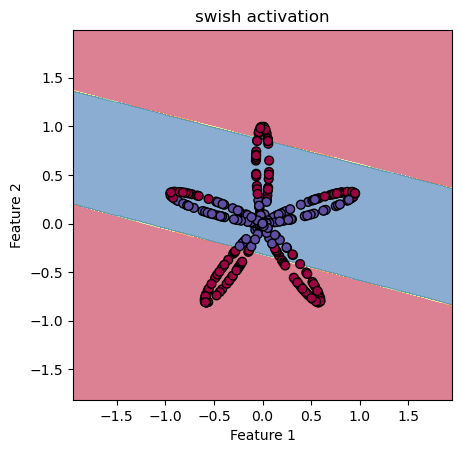


Running experiment with mish activation
Activation: mish, Test Accuracy: 0.9425
4656/4656 [==============================] - 4s 766us/step


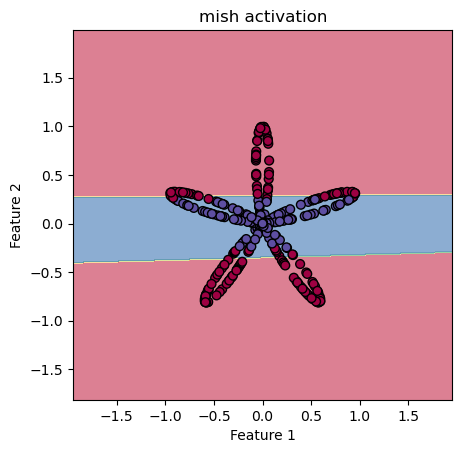


Running experiment with gelu activation
Activation: gelu, Test Accuracy: 0.9650
4656/4656 [==============================] - 4s 741us/step


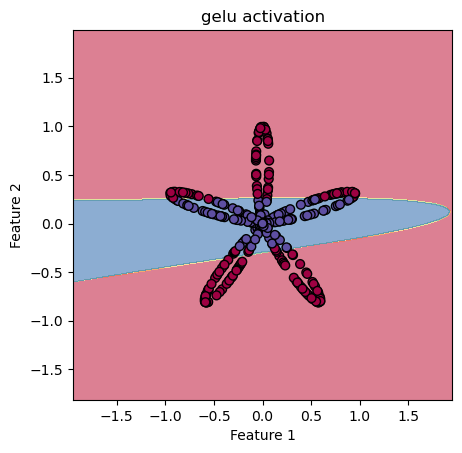

In [14]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


def mish(x):
    return x * tf.math.tanh(tf.math.softplus(x))


def generate_smooth_flower(n_samples=1000):
    t = np.linspace(0, 2*np.pi, n_samples)
    r = np.sin(5*t)**3
    X = np.column_stack((r * np.cos(t), r * np.sin(t)))
    y = np.where(np.abs(X[:, 1]) > 0.25, 0, 1)
    return X, y


X_smooth_flower, y_smooth_flower = generate_smooth_flower(n_samples=2000)
X_train, X_test, y_train, y_test = train_test_split(X_smooth_flower, y_smooth_flower, test_size=0.2, random_state=42, stratify=y_smooth_flower)

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))])
    
    for i, units in enumerate(hidden_units):
        model.add(layers.Dense(units, name=f'dense_{i}'))
        if activation == 'mish':
            model.add(layers.Lambda(mish))
        else:
            model.add(layers.Activation(activation))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int) 
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

def run_experiment(activation):
    H = [2]
    learning_rate = 0.001
    epochs = 60
    batch_size = 32

    model = create_model(activation, H)

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Activation: {activation}, Test Accuracy: {test_accuracy:.4f}")

    plot_decision_boundary(X_test, y_test, model, f'{activation} activation')

activations = ['relu', 'leaky_relu', 'elu', 'softplus', 'swish', 'mish', 'gelu']

for activation in activations:
    print(f"\nRunning experiment with {activation} activation")
    run_experiment(activation)


## SINE

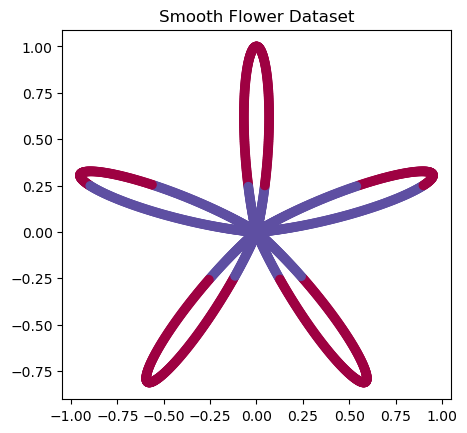


Running experiment with standard sine activation...
Epoch 1/60, Loss: 0.6936, Test Accuracy: 0.6425
Epoch 11/60, Loss: 0.6405, Test Accuracy: 0.6150
Epoch 21/60, Loss: 0.5680, Test Accuracy: 0.6925
Epoch 31/60, Loss: 0.4587, Test Accuracy: 0.7950
Epoch 41/60, Loss: 0.3750, Test Accuracy: 0.8300
Epoch 51/60, Loss: 0.3200, Test Accuracy: 0.8650
Final Test Accuracy: 0.8800
4656/4656 [==============================] - 6s 1ms/step


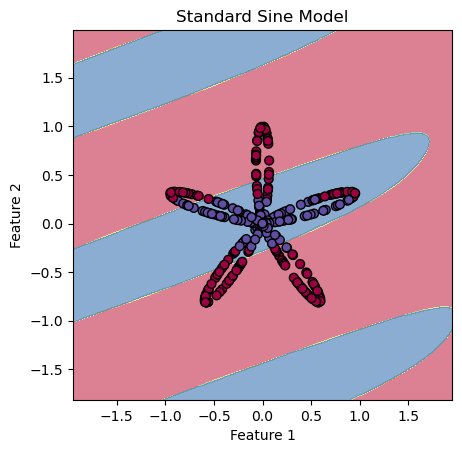


Summary of Results:
Final Test Accuracy: 0.8800


In [7]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split


class SineActivation(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
    
    def call(self, inputs):
        return tf.math.sin(inputs)


def generate_smooth_flower(n_samples=1000):
    t = np.linspace(0, 2*np.pi, n_samples)
    r = np.sin(5*t)**3
    X = np.column_stack((r * np.cos(t), r * np.sin(t)))
    y = np.where(np.abs(X[:, 1]) > 0.25, 0, 1)
    return X, y


X_smooth_flower, y_smooth_flower = generate_smooth_flower(n_samples=2000)
X_train, X_test, y_train, y_test = train_test_split(X_smooth_flower, y_smooth_flower, test_size=0.2, random_state=42, stratify=y_smooth_flower)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    for i, units in enumerate(hidden_units):
        if activation == 'sine':
            model.add(layers.Dense(units, name=f'dense_{i}'))
            model.add(SineActivation(name=f'sine_{i}'))
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()


def run_experiment():
   
    H = [2]  
    learning_rate = 0.001
    epochs = 60
    batch_size = 32


    model = create_model('sine', H)
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy', 
        metrics=['accuracy']
    )


    history = model.fit(
        X_train, y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(X_test, y_test),
        verbose=0
    )
    

    for epoch in range(0, epochs, 10):
        print(f"Epoch {epoch+1}/{epochs}, Loss: {history.history['loss'][epoch]:.4f}, "
              f"Test Accuracy: {history.history['val_accuracy'][epoch]:.4f}")


    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")
    

    plot_decision_boundary(X_test, y_test, model, 'Standard Sine Model')

    return test_accuracy


plot_dataset(X_smooth_flower, y_smooth_flower, "Smooth Flower Dataset")

print(f"\nRunning experiment with standard sine activation...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")

## 9.Vortex

## LASA

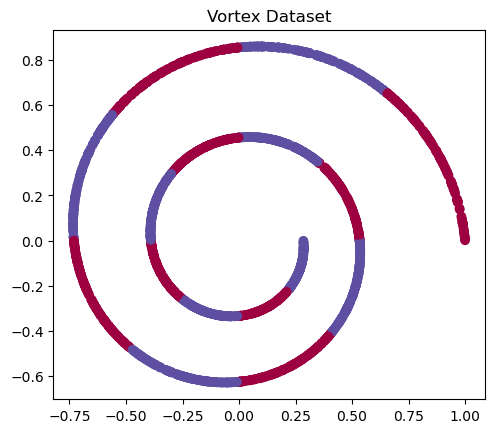


Running experiment with LASA...
Epoch 1/60, Avg Loss: 0.6952, Test Accuracy: 0.4900
Epoch 11/60, Avg Loss: 0.3006, Test Accuracy: 0.9300
Epoch 21/60, Avg Loss: 0.1409, Test Accuracy: 0.9700
Epoch 31/60, Avg Loss: 0.1071, Test Accuracy: 0.9800
Epoch 41/60, Avg Loss: 0.0903, Test Accuracy: 0.9875
Epoch 51/60, Avg Loss: 0.0799, Test Accuracy: 0.9900
Final Test Accuracy: 0.9900
Layer 1 - Initial k: 1.6, Final k: 3.7652
4079/4079 [==============================] - 4s 945us/step


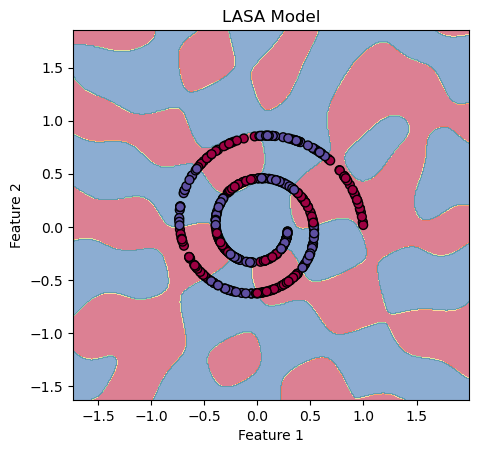


Summary of Results:
Final Test Accuracy: 0.9900


In [16]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split


class SineActivation(tf.keras.layers.Layer):
    def __init__(self, initial_frequency, **kwargs):
        super().__init__(**kwargs)
        self.initial_frequency = initial_frequency
    
    def build(self, input_shape):
        self.freq = self.add_weight(shape=(), 
                                    initializer=tf.keras.initializers.Constant(self.initial_frequency),
                                    trainable=True, 
                                    name='freq')
    
    def call(self, inputs):
        return tf.math.sin(self.freq * inputs)


def generate_vortex(n_samples=1000):
    t = np.random.uniform(0, 4*np.pi, n_samples)
    r = np.exp(-0.1 * t)
    X = np.column_stack((r * np.cos(t), r * np.sin(t)))
    y = np.where(np.sin(4*t) > 0, 0, 1)
    return X, y


X_vortex, y_vortex = generate_vortex(n_samples=2000)
X_train, X_test, y_train, y_test = train_test_split(X_vortex, y_vortex, test_size=0.2, random_state=42, stratify=y_vortex)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

def create_model(activation, hidden_units, k_values):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    sine_layers_k = []
    for i, units in enumerate(hidden_units):
        if activation == 'sine':
            model.add(layers.Dense(units, name=f'dense_{i}'))
            sine_activation_layer = SineActivation(initial_frequency=k_values[i], name=f'sine_{i}')
            model.add(sine_activation_layer)
            sine_layers_k.append(sine_activation_layer)
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model, sine_layers_k

def train_step(model, x_batch, y_batch, optimizer_main, optimizer_k):
    y_batch = tf.expand_dims(y_batch, axis=1)  
    with tf.GradientTape() as tape:
        predictions = model(x_batch, training=True)
        loss = tf.keras.losses.binary_crossentropy(y_batch, predictions)
        loss = tf.reduce_mean(loss)
    
    grads = tape.gradient(loss, model.trainable_variables)
    
    k_vars = [v for v in model.trainable_variables if 'freq' in v.name]
    other_vars = [v for v in model.trainable_variables if 'freq' not in v.name]
    
    k_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' in v.name]
    other_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' not in v.name]
    
    optimizer_k.apply_gradients(zip(k_grads, k_vars))
    optimizer_main.apply_gradients(zip(other_grads, other_vars))
    
    return loss


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()


def run_experiment():
    H = [8]  
    K = [1.6]  
    learning_rate_main = 0.01
    learning_rate_k = 0.01
    epochs = 60
    batch_size = 32

    model, sine_layers_k = create_model('sine', H, K)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    optimizer_main = Adam(learning_rate=learning_rate_main)
    optimizer_k = Adam(learning_rate=learning_rate_k)

    for epoch in range(epochs):
        total_loss = 0.0
        num_batches = 0
        for i in range(0, len(X_train), batch_size):
            x_batch = X_train[i:i+batch_size]
            y_batch = y_train[i:i+batch_size]
            
            batch_loss = train_step(model, x_batch, y_batch, optimizer_main, optimizer_k)
            total_loss += batch_loss.numpy()
            num_batches += 1
        
        avg_loss = total_loss / num_batches
        
        if epoch % 10 == 0:
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            print(f"Epoch {epoch+1}/{epochs}, Avg Loss: {avg_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")

    for i, layer in enumerate(sine_layers_k):
        print(f"Layer {i+1} - Initial k: {K[i]}, Final k: {layer.freq.numpy():.4f}")
    

    plot_decision_boundary(X_test, y_test, model, 'LASA Model')

    return test_accuracy

plot_dataset(X_vortex, y_vortex, "Vortex Dataset")

print(f"\nRunning experiment with LASA...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")


### All Activations 


Running experiment with relu activation
Activation: relu, Test Accuracy: 0.8775
4079/4079 [==============================] - 3s 757us/step


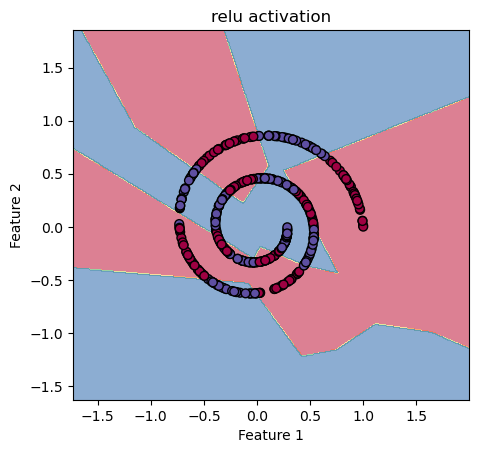


Running experiment with leaky_relu activation
Activation: leaky_relu, Test Accuracy: 0.7650
4079/4079 [==============================] - 3s 777us/step


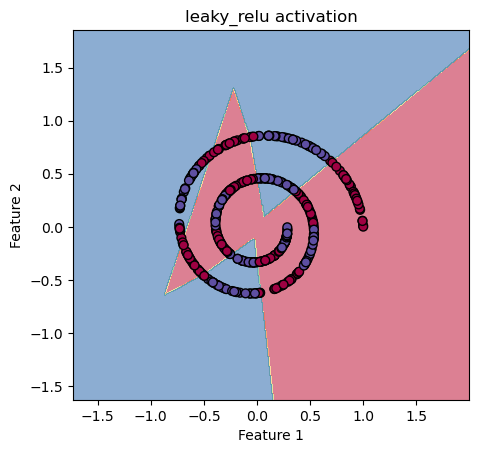


Running experiment with elu activation
Activation: elu, Test Accuracy: 0.6225
4079/4079 [==============================] - 3s 770us/step


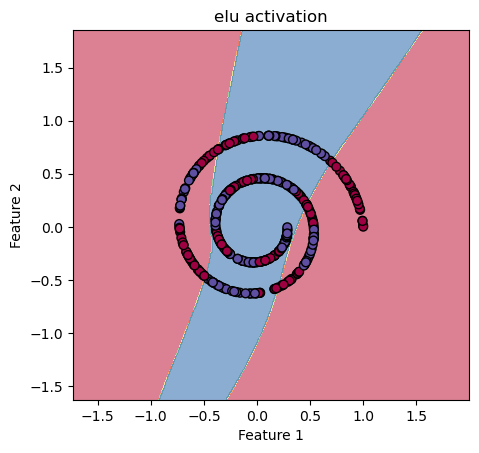


Running experiment with softplus activation
Activation: softplus, Test Accuracy: 0.6100
4079/4079 [==============================] - 3s 714us/step


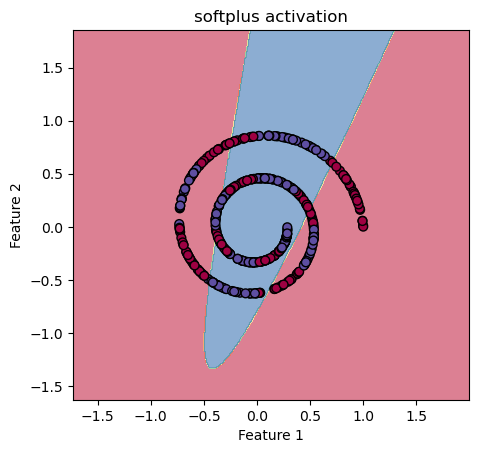


Running experiment with swish activation
Activation: swish, Test Accuracy: 0.6400
4079/4079 [==============================] - 3s 780us/step


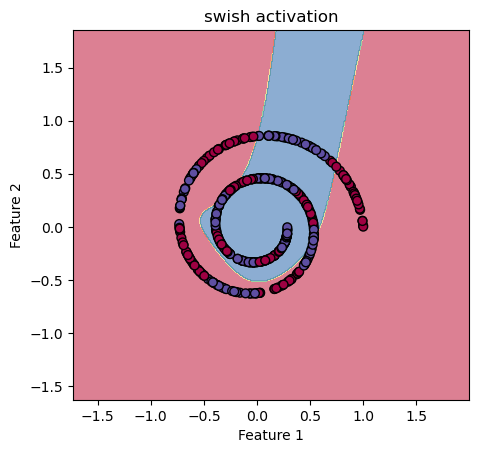


Running experiment with mish activation
Activation: mish, Test Accuracy: 0.7825
4079/4079 [==============================] - 3s 727us/step


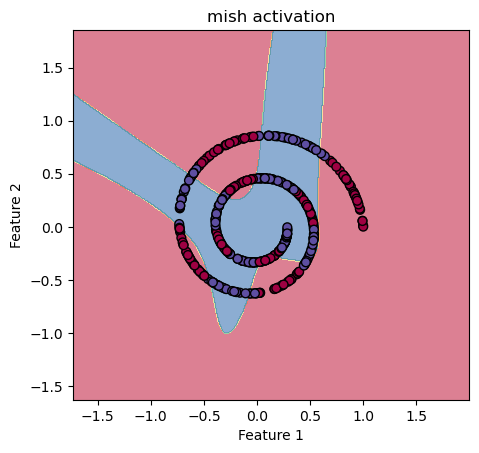


Running experiment with gelu activation
Activation: gelu, Test Accuracy: 0.9650
4079/4079 [==============================] - 3s 797us/step


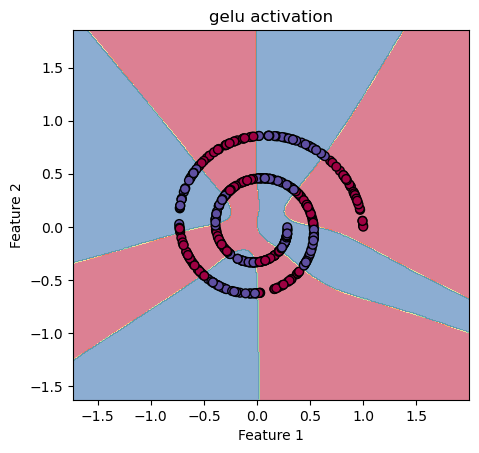

In [20]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


def mish(x):
    return x * tf.math.tanh(tf.math.softplus(x))


def generate_vortex(n_samples=1000):
    t = np.random.uniform(0, 4*np.pi, n_samples)
    r = np.exp(-0.1 * t)
    X = np.column_stack((r * np.cos(t), r * np.sin(t)))
    y = np.where(np.sin(4*t) > 0, 0, 1)
    return X, y


X_vortex, y_vortex = generate_vortex(n_samples=2000)
X_train, X_test, y_train, y_test = train_test_split(X_vortex, y_vortex, test_size=0.2, random_state=42, stratify=y_vortex)

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))])
    
    for i, units in enumerate(hidden_units):
        model.add(layers.Dense(units, name=f'dense_{i}'))
        if activation == 'mish':
            model.add(layers.Lambda(mish))
        else:
            model.add(layers.Activation(activation))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

def run_experiment(activation):
    H = [8]
    learning_rate = 0.01
    epochs = 60
    batch_size = 32

    model = create_model(activation, H)

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Activation: {activation}, Test Accuracy: {test_accuracy:.4f}")

    plot_decision_boundary(X_test, y_test, model, f'{activation} activation')

activations = ['relu', 'leaky_relu', 'elu', 'softplus', 'swish', 'mish', 'gelu']

for activation in activations:
    print(f"\nRunning experiment with {activation} activation")
    run_experiment(activation)


## SINE

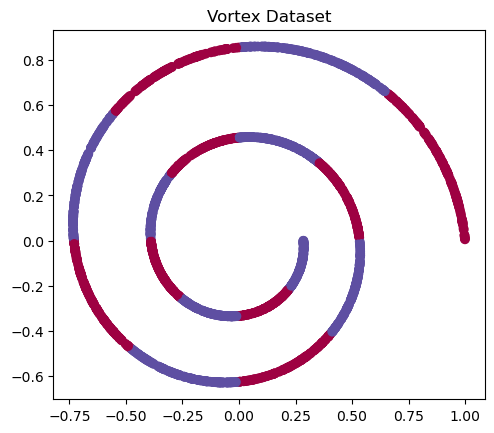


Running experiment with standard sine activation...
Epoch 1/60, Loss: 0.6991, Test Accuracy: 0.5150
Epoch 11/60, Loss: 0.6909, Test Accuracy: 0.4200
Epoch 21/60, Loss: 0.6907, Test Accuracy: 0.4125
Epoch 31/60, Loss: 0.6906, Test Accuracy: 0.4125
Epoch 41/60, Loss: 0.6906, Test Accuracy: 0.4250
Epoch 51/60, Loss: 0.6903, Test Accuracy: 0.4100
Final Test Accuracy: 0.4125
4069/4069 [==============================] - 4s 1ms/step


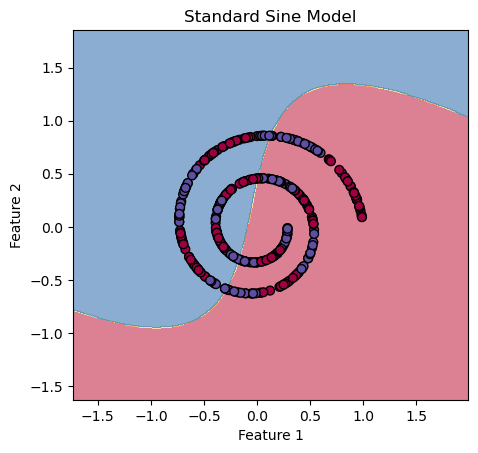


Summary of Results:
Final Test Accuracy: 0.4125


In [9]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split


class SineActivation(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
    
    def call(self, inputs):
        return tf.math.sin(inputs)


def generate_vortex(n_samples=1000):
    t = np.random.uniform(0, 4*np.pi, n_samples)
    r = np.exp(-0.1 * t)
    X = np.column_stack((r * np.cos(t), r * np.sin(t)))
    y = np.where(np.sin(4*t) > 0, 0, 1)
    return X, y


X_vortex, y_vortex = generate_vortex(n_samples=2000)
X_train, X_test, y_train, y_test = train_test_split(X_vortex, y_vortex, test_size=0.2, random_state=42, stratify=y_vortex)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    for i, units in enumerate(hidden_units):
        if activation == 'sine':
            model.add(layers.Dense(units, name=f'dense_{i}'))
            model.add(SineActivation(name=f'sine_{i}'))
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()


def run_experiment():
 
    H = [8]  
    learning_rate = 0.01
    epochs = 60
    batch_size = 32


    model = create_model('sine', H)
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy', 
        metrics=['accuracy']
    )

  
    history = model.fit(
        X_train, y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(X_test, y_test),
        verbose=0
    )
    
   
    for epoch in range(0, epochs, 10):
        print(f"Epoch {epoch+1}/{epochs}, Loss: {history.history['loss'][epoch]:.4f}, "
              f"Test Accuracy: {history.history['val_accuracy'][epoch]:.4f}")


    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")
    
  
    plot_decision_boundary(X_test, y_test, model, 'Standard Sine Model')

    return test_accuracy


plot_dataset(X_vortex, y_vortex, "Vortex Dataset")

print(f"\nRunning experiment with standard sine activation...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")

## 10.Pinwheel

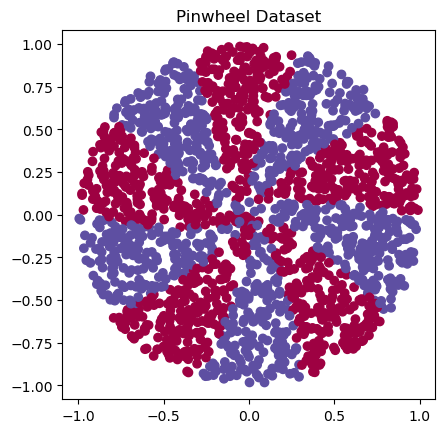


Running experiment with LASA...
Epoch 1/60, Avg Loss: 0.7080, Test Accuracy: 0.6625
Epoch 11/60, Avg Loss: 0.5009, Test Accuracy: 0.8000
Epoch 21/60, Avg Loss: 0.5001, Test Accuracy: 0.8000
Epoch 31/60, Avg Loss: 0.4998, Test Accuracy: 0.8000
Epoch 41/60, Avg Loss: 0.4996, Test Accuracy: 0.7975
Epoch 51/60, Avg Loss: 0.4995, Test Accuracy: 0.8000
Final Test Accuracy: 0.8000
Layer 1 - Initial k: 3.6, Final k: 4.0965
4839/4839 [==============================] - 5s 975us/step


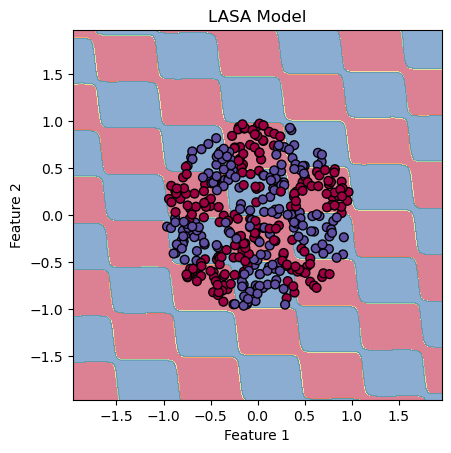


Summary of Results:
Final Test Accuracy: 0.8000


In [32]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split

class SineActivation(tf.keras.layers.Layer):
    def __init__(self, initial_frequency, **kwargs):
        super().__init__(**kwargs)
        self.initial_frequency = initial_frequency
    
    def build(self, input_shape):
        self.freq = self.add_weight(shape=(), 
                                    initializer=tf.keras.initializers.Constant(self.initial_frequency),
                                    trainable=True, 
                                    name='freq')
    
    def call(self, inputs):
        return tf.math.sin(self.freq * inputs)


def generate_pinwheel(n_samples=1000, arms=5):
    t = np.random.uniform(0, 2*np.pi, n_samples)
    r = np.random.uniform(0, 1, n_samples)**(1/2)
    X = np.column_stack((r * np.cos(t), r * np.sin(t)))
    y = np.where((arms * t + np.log(r)) % (2*np.pi) < np.pi, 0, 1)
    return X, y


X_pinwheel, y_pinwheel = generate_pinwheel(n_samples=2000)
X_train, X_test, y_train, y_test = train_test_split(X_pinwheel, y_pinwheel, test_size=0.2, random_state=42, stratify=y_pinwheel)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

def create_model(activation, hidden_units, k_values):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    sine_layers_k = []
    for i, units in enumerate(hidden_units):
        if (activation == 'sine'):
            model.add(layers.Dense(units, name=f'dense_{i}'))
            sine_activation_layer = SineActivation(initial_frequency=k_values[i], name=f'sine_{i}')
            model.add(sine_activation_layer)
            sine_layers_k.append(sine_activation_layer)
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model, sine_layers_k

def train_step(model, x_batch, y_batch, optimizer_main, optimizer_k):
    y_batch = tf.expand_dims(y_batch, axis=1) 
    with tf.GradientTape() as tape:
        predictions = model(x_batch, training=True)
        loss = tf.keras.losses.binary_crossentropy(y_batch, predictions)
        loss = tf.reduce_mean(loss)
    
    grads = tape.gradient(loss, model.trainable_variables)
    
    k_vars = [v for v in model.trainable_variables if 'freq' in v.name]
    other_vars = [v for v in model.trainable_variables if 'freq' not in v.name]
    
    k_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' in v.name]
    other_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' not in v.name]
    
    optimizer_k.apply_gradients(zip(k_grads, k_vars))
    optimizer_main.apply_gradients(zip(other_grads, other_vars))
    
    return loss


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()


def run_experiment():
    H = [2]  
    K = [3.6]  
    learning_rate_main = 0.01
    learning_rate_k = 0.01
    epochs = 60
    batch_size = 32

    model, sine_layers_k = create_model('sine', H, K)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    optimizer_main = Adam(learning_rate=learning_rate_main)
    optimizer_k = Adam(learning_rate=learning_rate_k)

    for epoch in range(epochs):
        total_loss = 0.0
        num_batches = 0
        for i in range(0, len(X_train), batch_size):
            x_batch = X_train[i:i+batch_size]
            y_batch = y_train[i:i+batch_size]
            
            batch_loss = train_step(model, x_batch, y_batch, optimizer_main, optimizer_k)
            total_loss += batch_loss.numpy()
            num_batches += 1
        
        avg_loss = total_loss / num_batches
        
        if (epoch % 10 == 0):
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            print(f"Epoch {epoch+1}/{epochs}, Avg Loss: {avg_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")

    for i, layer in enumerate(sine_layers_k):
        print(f"Layer {i+1} - Initial k: {K[i]}, Final k: {layer.freq.numpy():.4f}")
    

    plot_decision_boundary(X_test, y_test, model, 'LASA Model')

    return test_accuracy

plot_dataset(X_pinwheel, y_pinwheel, "Pinwheel Dataset")

print(f"\nRunning experiment with LASA...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")


## All Activations


Running experiment with relu activation
Activation: relu, Test Accuracy: 0.4450
4729/4729 [==============================] - 4s 720us/step


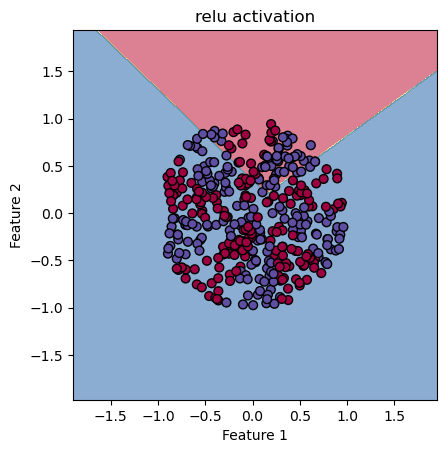


Running experiment with leaky_relu activation
Activation: leaky_relu, Test Accuracy: 0.5250
4729/4729 [==============================] - 4s 793us/step


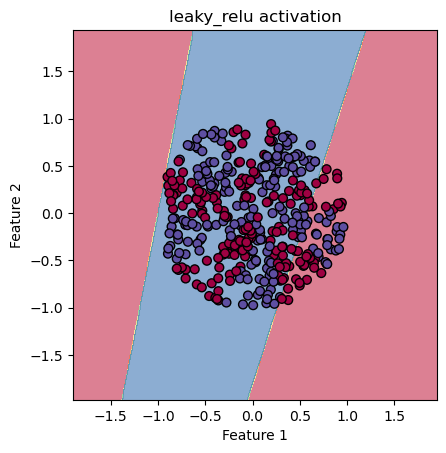


Running experiment with elu activation
Activation: elu, Test Accuracy: 0.5375
4729/4729 [==============================] - 4s 844us/step


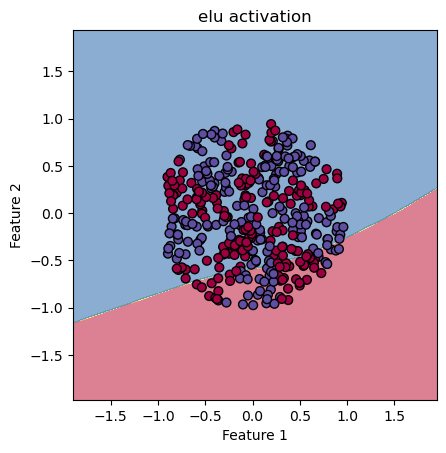


Running experiment with softplus activation
Activation: softplus, Test Accuracy: 0.5350
4729/4729 [==============================] - 4s 833us/step


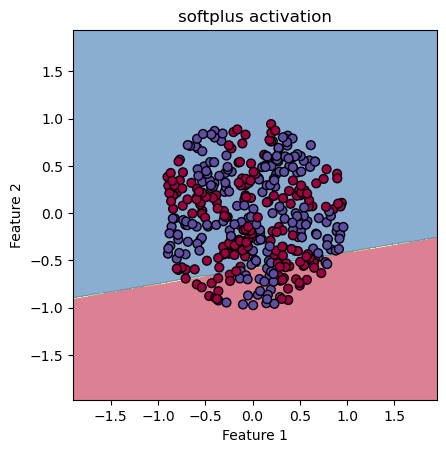


Running experiment with swish activation
Activation: swish, Test Accuracy: 0.5475
4729/4729 [==============================] - 4s 863us/step


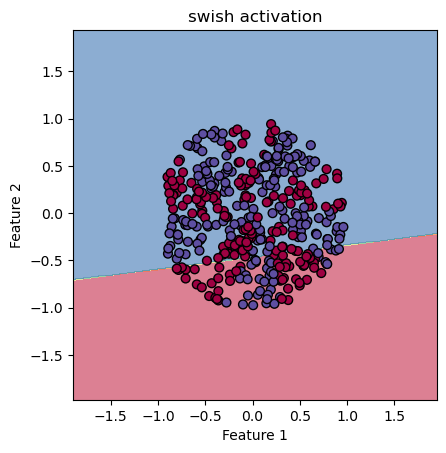


Running experiment with mish activation
Activation: mish, Test Accuracy: 0.5475
4729/4729 [==============================] - 5s 1ms/step


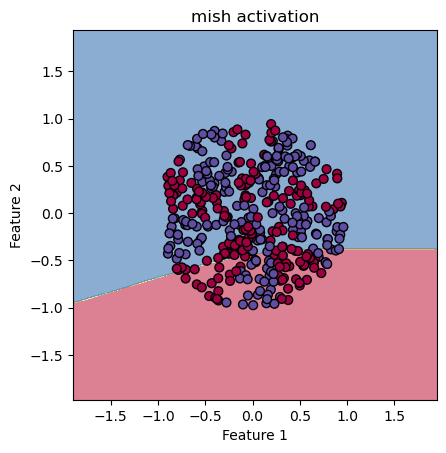


Running experiment with gelu activation
Activation: gelu, Test Accuracy: 0.5300
4729/4729 [==============================] - 6s 1ms/step


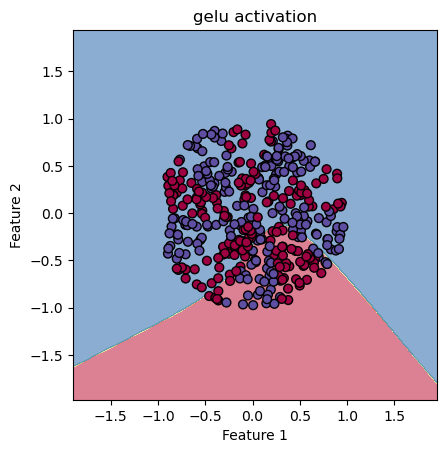

In [33]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


def mish(x):
    return x * tf.math.tanh(tf.math.softplus(x))


def generate_pinwheel(n_samples=1000, arms=5):
    t = np.random.uniform(0, 2*np.pi, n_samples)
    r = np.random.uniform(0, 1, n_samples)**(1/2)
    X = np.column_stack((r * np.cos(t), r * np.sin(t)))
    y = np.where((arms * t + np.log(r)) % (2*np.pi) < np.pi, 0, 1)
    return X, y


X_pinwheel, y_pinwheel = generate_pinwheel(n_samples=2000)
X_train, X_test, y_train, y_test = train_test_split(X_pinwheel, y_pinwheel, test_size=0.2, random_state=42, stratify=y_pinwheel)

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))])
    
    for i, units in enumerate(hidden_units):
        model.add(layers.Dense(units, name=f'dense_{i}'))
        if activation == 'mish':
            model.add(layers.Lambda(mish))
        else:
            model.add(layers.Activation(activation))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

def run_experiment(activation):
    H = [2]
    learning_rate = 0.01
    epochs = 60
    batch_size = 32

    model = create_model(activation, H)

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Activation: {activation}, Test Accuracy: {test_accuracy:.4f}")

    plot_decision_boundary(X_test, y_test, model, f'{activation} activation')

activations = ['relu', 'leaky_relu', 'elu', 'softplus', 'swish', 'mish', 'gelu']

for activation in activations:
    print(f"\nRunning experiment with {activation} activation")
    run_experiment(activation)


## SINE

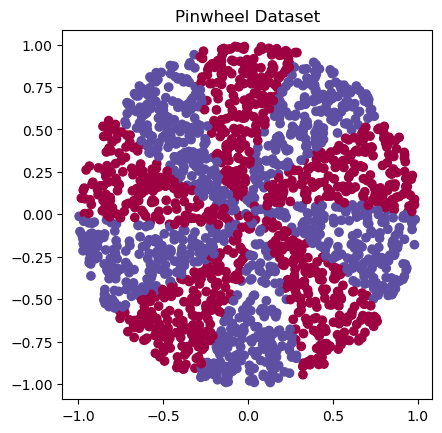


Running experiment with standard sine activation...
Epoch 1/60, Loss: 0.7034, Test Accuracy: 0.4550
Epoch 11/60, Loss: 0.6936, Test Accuracy: 0.4800
Epoch 21/60, Loss: 0.6936, Test Accuracy: 0.4575
Epoch 31/60, Loss: 0.6930, Test Accuracy: 0.4825
Epoch 41/60, Loss: 0.6928, Test Accuracy: 0.5225
Epoch 51/60, Loss: 0.6932, Test Accuracy: 0.4525
Final Test Accuracy: 0.4575
4901/4901 [==============================] - 8s 2ms/step


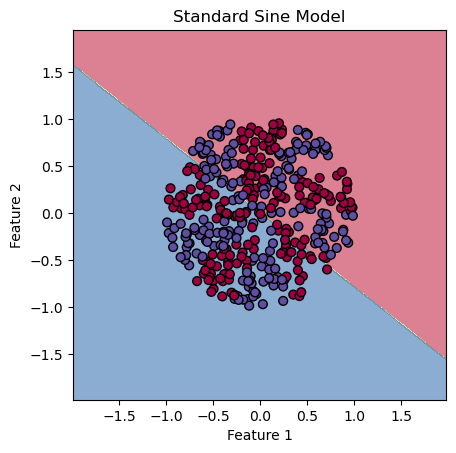


Summary of Results:
Final Test Accuracy: 0.4575


In [10]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split


class SineActivation(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
    
    def call(self, inputs):
        return tf.math.sin(inputs)


def generate_pinwheel(n_samples=1000, arms=5):
    t = np.random.uniform(0, 2*np.pi, n_samples)
    r = np.random.uniform(0, 1, n_samples)**(1/2)
    X = np.column_stack((r * np.cos(t), r * np.sin(t)))
    y = np.where((arms * t + np.log(r)) % (2*np.pi) < np.pi, 0, 1)
    return X, y


X_pinwheel, y_pinwheel = generate_pinwheel(n_samples=2000)
X_train, X_test, y_train, y_test = train_test_split(X_pinwheel, y_pinwheel, test_size=0.2, random_state=42, stratify=y_pinwheel)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    for i, units in enumerate(hidden_units):
        if activation == 'sine':
            model.add(layers.Dense(units, name=f'dense_{i}'))
            model.add(SineActivation(name=f'sine_{i}'))
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()


def run_experiment():
 
    H = [2]  
    learning_rate = 0.01
    epochs = 60
    batch_size = 32


    model = create_model('sine', H)
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='binary_crossentropy', 
        metrics=['accuracy']
    )


    history = model.fit(
        X_train, y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(X_test, y_test),
        verbose=0
    )
    
   
    for epoch in range(0, epochs, 10):
        print(f"Epoch {epoch+1}/{epochs}, Loss: {history.history['loss'][epoch]:.4f}, "
              f"Test Accuracy: {history.history['val_accuracy'][epoch]:.4f}")


    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")
    

    plot_decision_boundary(X_test, y_test, model, 'Standard Sine Model')

    return test_accuracy


plot_dataset(X_pinwheel, y_pinwheel, "Pinwheel Dataset")

print(f"\nRunning experiment with standard sine activation...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")

## 11.Lissajous

### LASA

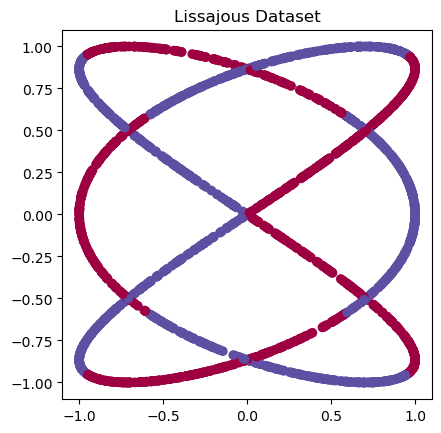


Running experiment with LASA...
Epoch 1/60, Avg Loss: 0.7557, Test Accuracy: 0.4725
Epoch 11/60, Avg Loss: 0.2976, Test Accuracy: 0.8950
Epoch 21/60, Avg Loss: 0.2391, Test Accuracy: 0.8950
Epoch 31/60, Avg Loss: 0.2200, Test Accuracy: 0.9125
Epoch 41/60, Avg Loss: 0.2095, Test Accuracy: 0.9075
Epoch 51/60, Avg Loss: 0.2026, Test Accuracy: 0.9175
Final Test Accuracy: 0.9200
Layer 1 - Initial k: 3.6, Final k: 3.9273
5000/5000 [==============================] - 5s 892us/step


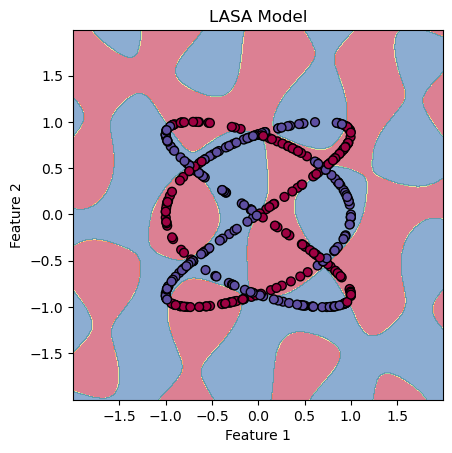


Summary of Results:
Final Test Accuracy: 0.9200


In [41]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split


class SineActivation(tf.keras.layers.Layer):
    def __init__(self, initial_frequency, **kwargs):
        super().__init__(**kwargs)
        self.initial_frequency = initial_frequency
    
    def build(self, input_shape):
        self.freq = self.add_weight(shape=(), 
                                    initializer=tf.keras.initializers.Constant(self.initial_frequency),
                                    trainable=True, 
                                    name='freq')
    
    def call(self, inputs):
        return tf.math.sin(self.freq * inputs)


def generate_lissajous(n_samples=1000):
    t = np.random.uniform(0, 2*np.pi, n_samples)
    X = np.column_stack((np.sin(3*t), np.sin(2*t)))
    y = np.where(np.sin(5*t) > 0, 0, 1)
    return X, y


X_lissajous, y_lissajous = generate_lissajous(n_samples=2000)
X_train, X_test, y_train, y_test = train_test_split(X_lissajous, y_lissajous, test_size=0.2, random_state=42, stratify=y_lissajous)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

def create_model(activation, hidden_units, k_values):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    sine_layers_k = []
    for i, units in enumerate(hidden_units):
        if (activation == 'sine'):
            model.add(layers.Dense(units, name=f'dense_{i}'))
            sine_activation_layer = SineActivation(initial_frequency=k_values[i], name=f'sine_{i}')
            model.add(sine_activation_layer)
            sine_layers_k.append(sine_activation_layer)
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model, sine_layers_k

def train_step(model, x_batch, y_batch, optimizer_main, optimizer_k):
    y_batch = tf.expand_dims(y_batch, axis=1)  
    with tf.GradientTape() as tape:
        predictions = model(x_batch, training=True)
        loss = tf.keras.losses.binary_crossentropy(y_batch, predictions)
        loss = tf.reduce_mean(loss)
    
    grads = tape.gradient(loss, model.trainable_variables)
    
    k_vars = [v for v in model.trainable_variables if 'freq' in v.name]
    other_vars = [v for v in model.trainable_variables if 'freq' not in v.name]
    
    k_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' in v.name]
    other_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' not in v.name]
    
    optimizer_k.apply_gradients(zip(k_grads, k_vars))
    optimizer_main.apply_gradients(zip(other_grads, other_vars))
    
    return loss


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int) 
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

def run_experiment():
    H = [6]  
    K = [3.6]  
    learning_rate_main = 0.01
    learning_rate_k = 0.01
    epochs = 60
    batch_size = 32

    model, sine_layers_k = create_model('sine', H, K)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    optimizer_main = Adam(learning_rate=learning_rate_main)
    optimizer_k = Adam(learning_rate=learning_rate_k)

    for epoch in range(epochs):
        total_loss = 0.0
        num_batches = 0
        for i in range(0, len(X_train), batch_size):
            x_batch = X_train[i:i+batch_size]
            y_batch = y_train[i:i+batch_size]
            
            batch_loss = train_step(model, x_batch, y_batch, optimizer_main, optimizer_k)
            total_loss += batch_loss.numpy()
            num_batches += 1
        
        avg_loss = total_loss / num_batches
        
        if (epoch % 10 == 0):
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            print(f"Epoch {epoch+1}/{epochs}, Avg Loss: {avg_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")

    for i, layer in enumerate(sine_layers_k):
        print(f"Layer {i+1} - Initial k: {K[i]}, Final k: {layer.freq.numpy():.4f}")
    

    plot_decision_boundary(X_test, y_test, model, 'LASA Model')

    return test_accuracy

plot_dataset(X_lissajous, y_lissajous, "Lissajous Dataset")

print(f"\nRunning experiment with LASA...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")


###  All Activations


Running experiment with relu activation
Activation: relu, Test Accuracy: 0.6850
5000/5000 [==============================] - 4s 748us/step


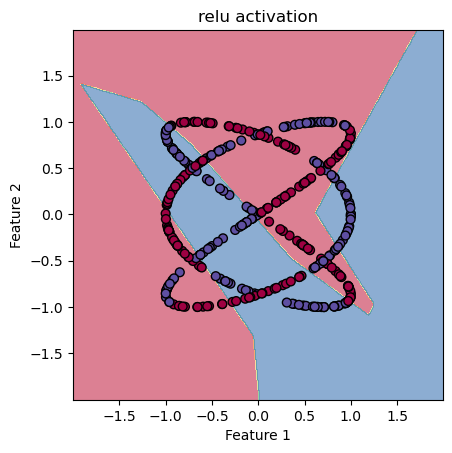


Running experiment with leaky_relu activation
Activation: leaky_relu, Test Accuracy: 0.7100
5000/5000 [==============================] - 4s 776us/step


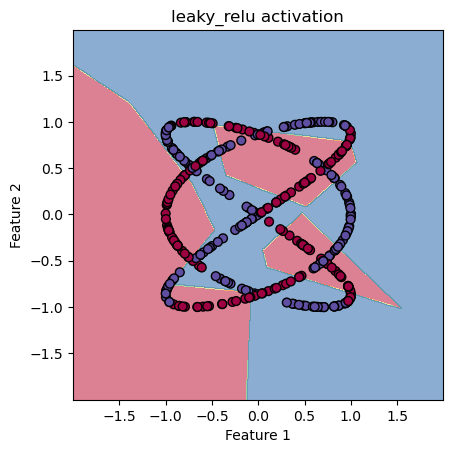


Running experiment with elu activation
Activation: elu, Test Accuracy: 0.5100
5000/5000 [==============================] - 4s 792us/step


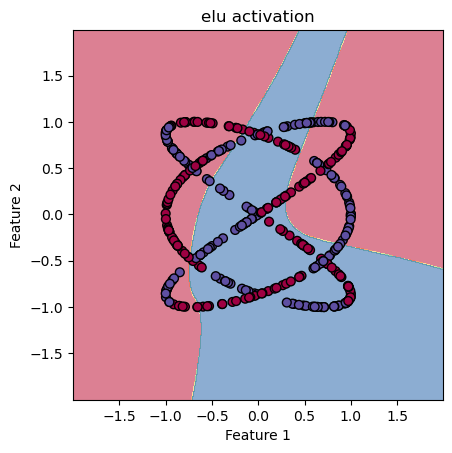


Running experiment with softplus activation
Activation: softplus, Test Accuracy: 0.4775
5000/5000 [==============================] - 4s 777us/step


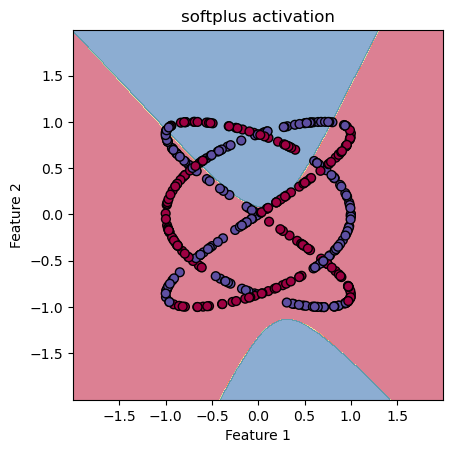


Running experiment with swish activation
Activation: swish, Test Accuracy: 0.5200
5000/5000 [==============================] - 4s 741us/step


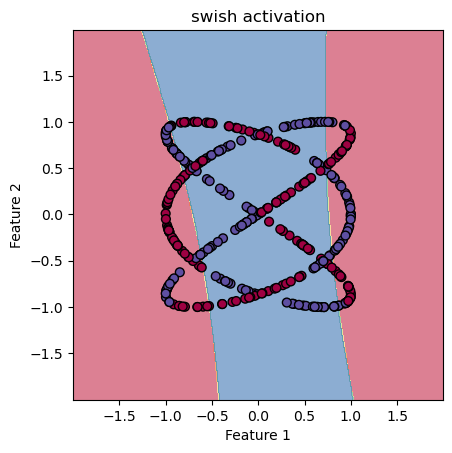


Running experiment with mish activation
Activation: mish, Test Accuracy: 0.5550
5000/5000 [==============================] - 4s 764us/step


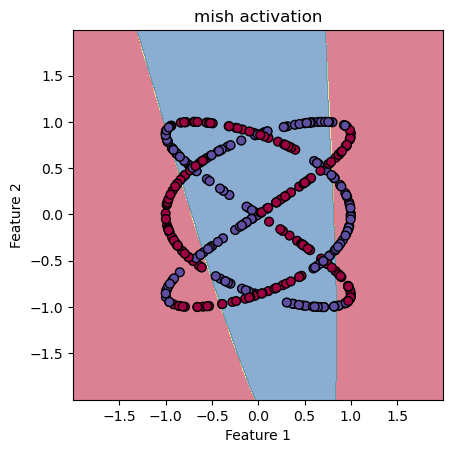


Running experiment with gelu activation
Activation: gelu, Test Accuracy: 0.5650
5000/5000 [==============================] - 4s 765us/step


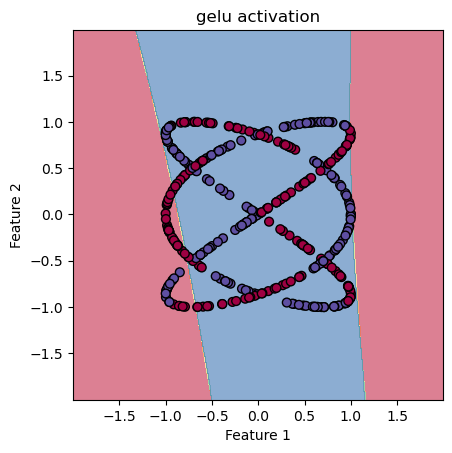

In [42]:
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


def mish(x):
    return x * tf.math.tanh(tf.math.softplus(x))


def generate_lissajous(n_samples=1000):
    t = np.random.uniform(0, 2*np.pi, n_samples)
    X = np.column_stack((np.sin(3*t), np.sin(2*t)))
    y = np.where(np.sin(5*t) > 0, 0, 1)
    return X, y


X_lissajous, y_lissajous = generate_lissajous(n_samples=2000)
X_train, X_test, y_train, y_test = train_test_split(X_lissajous, y_lissajous, test_size=0.2, random_state=42, stratify=y_lissajous)

def create_model(activation, hidden_units):
    model = Sequential([layers.Input(shape=(2,))])
    
    for i, units in enumerate(hidden_units):
        model.add(layers.Dense(units, name=f'dense_{i}'))
        if activation == 'mish':
            model.add(layers.Lambda(mish))
        else:
            model.add(layers.Activation(activation))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int)  
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.gca().set_aspect('equal', adjustable='box')
    plt.show()

def run_experiment(activation):
    H = [6]
    learning_rate = 0.01
    epochs = 60
    batch_size = 32

    model = create_model(activation, H)

    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Activation: {activation}, Test Accuracy: {test_accuracy:.4f}")

    plot_decision_boundary(X_test, y_test, model, f'{activation} activation')

activations = ['relu', 'leaky_relu', 'elu', 'softplus', 'swish', 'mish', 'gelu']

for activation in activations:
    print(f"\nRunning experiment with {activation} activation")
    run_experiment(activation)


## Comparison with Variational Methods in Optical Quantum Machine Learning

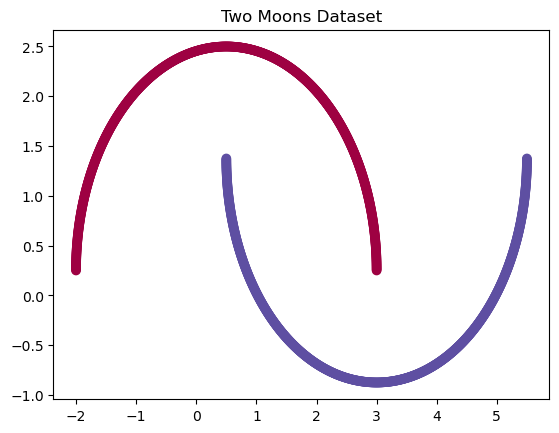


Running experiment with LASA...
Epoch 1/15, Avg Loss: 0.4967, Test Accuracy: 0.9000
Epoch 11/15, Avg Loss: 0.0369, Test Accuracy: 1.0000
Final Test Accuracy: 1.0000
Layer 1 - Initial k: 1.6, Final k: 1.4538
15972/15972 [==============================] - 14s 875us/step


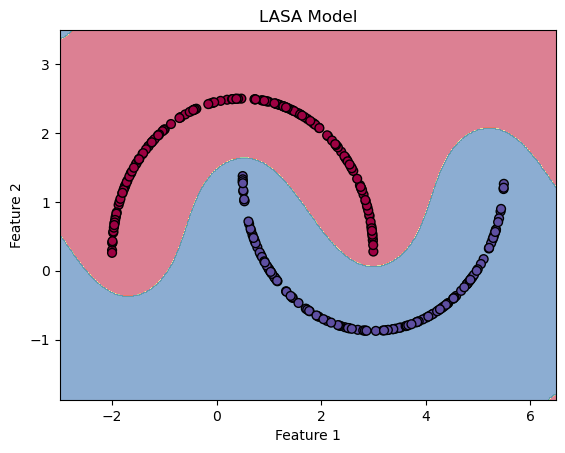


Summary of Results:
Final Test Accuracy: 1.0000


In [7]:
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, Sequential
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_moons
import matplotlib.pyplot as plt

def custom_two_moons(n_samples=1500, random_state=None):
    if random_state is not None:
        np.random.seed(random_state)
    
    n_samples_per_class = n_samples // 2
    
 
    t = np.linspace(0, np.pi, n_samples_per_class)
    x1 = np.cos(t)
    y1 = np.sin(t)
    
 
    x2 = 1 - np.cos(t)
    y2 = 1 - np.sin(t) - 0.5
    
 
    X = np.vstack((np.column_stack((x1, y1)), np.column_stack((x2, y2))))
    y = np.hstack((np.zeros(n_samples_per_class), np.ones(n_samples_per_class)))
    
  
    X[:, 0] = X[:, 0] * 2.5 + 0.5  
    X[:, 1] = X[:, 1] * 2.25 + 0.25  
    

    shuffle_idx = np.random.permutation(n_samples)
    X, y = X[shuffle_idx], y[shuffle_idx]
    
    return X, y


X_moons, y_moons = custom_two_moons(n_samples=1500, random_state=42)


X_train, X_test, y_train, y_test = train_test_split(X_moons, y_moons, test_size=0.2, random_state=42)


class SineActivation(tf.keras.layers.Layer):
    def __init__(self, initial_frequency, **kwargs):
        super().__init__(**kwargs)
        self.initial_frequency = initial_frequency
    
    def build(self, input_shape):
        self.freq = self.add_weight(shape=(), 
                                    initializer=tf.keras.initializers.Constant(self.initial_frequency),
                                    trainable=True, 
                                    name='freq')
    
    def call(self, inputs):
        return tf.math.sin(self.freq * inputs)


def plot_dataset(X, y, title):
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=plt.get_cmap('Spectral'))
    plt.title(title)
    plt.show()

def create_model(activation, hidden_units, k_values):
    model = Sequential([layers.Input(shape=(2,))]) 
    
    sine_layers_k = []
    for i, units in enumerate(hidden_units):
        if activation == 'sine':
            model.add(layers.Dense(units, name=f'dense_{i}'))
            sine_activation_layer = SineActivation(initial_frequency=k_values[i], name=f'sine_{i}')
            model.add(sine_activation_layer)
            sine_layers_k.append(sine_activation_layer)
        else:
            model.add(layers.Dense(units, activation=activation, name=f'dense_{i}'))
    
    model.add(layers.Dense(1, activation='sigmoid', name='output'))
    return model, sine_layers_k

def train_step(model, x_batch, y_batch, optimizer_main, optimizer_k):
    y_batch = tf.expand_dims(y_batch, axis=1)  
    with tf.GradientTape() as tape:
        predictions = model(x_batch, training=True)
        loss = tf.keras.losses.binary_crossentropy(y_batch, predictions)
        loss = tf.reduce_mean(loss)
    
    grads = tape.gradient(loss, model.trainable_variables)
    
    k_vars = [v for v in model.trainable_variables if 'freq' in v.name]
    other_vars = [v for v in model.trainable_variables if 'freq' not in v.name]
    
    k_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' in v.name]
    other_grads = [g for g, v in zip(grads, model.trainable_variables) if 'freq' not in v.name]
    
    optimizer_k.apply_gradients(zip(k_grads, k_vars))
    optimizer_main.apply_gradients(zip(other_grads, other_vars))
    
    return loss


def plot_decision_boundary(X, y, model, title, resolution=0.01):
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, resolution),
                         np.arange(y_min, y_max, resolution))
    
    grid = np.c_[xx.ravel(), yy.ravel()]
    Z = model.predict(grid)
    Z = (Z > 0.5).astype(int) 
    Z = Z.reshape(xx.shape)
    
    plt.contourf(xx, yy, Z, alpha=0.6, cmap='Spectral')
    plt.scatter(X[:, 0], X[:, 1], c=y, s=40, edgecolor='k', cmap='Spectral')
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()


def run_experiment():
    H = [4]  
    K = [1.6] 
    learning_rate_main = 0.01
    learning_rate_k = 0.01
    epochs = 15
    batch_size = 32

    model, sine_layers_k = create_model('sine', H, K)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    optimizer_main = Adam(learning_rate=learning_rate_main)
    optimizer_k = Adam(learning_rate=learning_rate_k)

    for epoch in range(epochs):
        total_loss = 0.0
        num_batches = 0
        for i in range(0, len(X_train), batch_size):
            x_batch = X_train[i:i+batch_size]
            y_batch = y_train[i:i+batch_size]
            
            batch_loss = train_step(model, x_batch, y_batch, optimizer_main, optimizer_k)
            total_loss += batch_loss.numpy()
            num_batches += 1
        
        avg_loss = total_loss / num_batches
        
        if epoch % 10 == 0:
            test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
            print(f"Epoch {epoch+1}/{epochs}, Avg Loss: {avg_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

    test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
    print(f"Final Test Accuracy: {test_accuracy:.4f}")

    for i, layer in enumerate(sine_layers_k):
        print(f"Layer {i+1} - Initial k: {K[i]}, Final k: {layer.freq.numpy():.4f}")
    
  
    plot_decision_boundary(X_test, y_test, model, 'LASA Model')

    return test_accuracy


plot_dataset(X_moons, y_moons, "Two Moons Dataset")

print(f"\nRunning experiment with LASA...")
accuracy = run_experiment()

print("\nSummary of Results:")
print(f"Final Test Accuracy: {accuracy:.4f}")
